# Portfolio Analysis

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/EnriqueGarcia180/Finance/blob/main/EnriqueGarcia.ipynb)

# Colab setup

In [1]:
import os

# 1. Configuration
repo_name = 'Finance'
repo_url = f"https://github.com/EnriqueGarcia180/{repo_name}.git"

# 2. Execution logic
if 'google.colab' in str(get_ipython()):
    if os.path.exists(repo_name):
        print("✅ Folder exists. Pulling latest changes from GitHub...")
        %cd {repo_name}
        !git pull origin main
    else:
        print("🚀 First time on this Colab machine. Cloning repository...")
        !git clone {repo_url}
        %cd {repo_name}
    print(f"📍 Current working directory: {os.getcwd()}")
else:
    print("💻 Running locally in VS Code. No cloning needed.")



💻 Running locally in VS Code. No cloning needed.


# Libraries

In [2]:
#Instalar librerias
import importlib.util
import sys

def check_and_install_library(library_name_list: list):
    for library_name in library_name_list:
        spec = importlib.util.find_spec(library_name)
        if spec is None:
            print(f"Library '{library_name}' not found. Installing...")
            try:
                # Use pip to install the library
                # The ! prefix runs shell commands from within Jupyter
                !{sys.executable} -m pip install {library_name}
                print(f"Library '{library_name}' installed successfully.")
            except Exception as e:
                print(f"Error installing '{library_name}': {e}")
        # else:
            # print(f"Library '{library_name}' is already installed.")
    return

library_name_list = ['pandas', 'numpy', 'jupyter', 'notebook', 'yfinance', 'matplotlib.pyplot', 'json', 'ipynb', 'import_ipynb', 'datetime',
                     'ipywidgets', 'IPython.display', 'anywidget',# widgets
                     'nbconvert', 'pandoc', 'TeX', 'pdfkit', 'wkhtmltopdf'] #To export to HTML and PDF

check_and_install_library(library_name_list)

import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import ipywidgets as widgets
import json
import nbconvert
import import_ipynb
import logging
from plotly.graph_objects import FigureWidget
from IPython.display import display, clear_output
from datetime import datetime
from dataclasses import dataclass


# Silence yfinance from printing '404' or 'delisted' errors to the console
logging.getLogger('yfinance').setLevel(logging.CRITICAL)

# Load the 'metrics_config.json' globally or at the start of your main script
with open('metrics_config.json', 'r') as f:
    metrics_config = json.load(f)

Library 'TeX' not found. Installing...
Library 'TeX' installed successfully.


In [3]:
import functions # type: ignore # => .../functions.ipynb     file attached
importlib.reload(functions) # Reloads the module
%reload_ext autoreload
%autoreload 2

# Dates

In [4]:
#Dates (YYYY-M-D)
global start_date
start_date = datetime(2021, 1, 9) # <- date in which brokerage account started
# start_date = datetime(2025, 1, 1) # <- date in which brokerage account started

today = datetime.today()
today = today.replace(hour=0, minute=0, second=0, microsecond=0)
no_days = today - start_date
print(f" \
      Start Date: {start_date},\n \
      End Date: {today},\n \
      number of days {no_days}")

       Start Date: 2021-01-09 00:00:00,
       End Date: 2026-01-26 00:00:00,
       number of days 1843 days, 0:00:00


# Risk Free Rate

In [5]:
risk_free = 0.0330 #0.04152 10-year treasury

# Tickers

**Background**: From an initial list of 'N' assets (tickers) choose a number greather than 5 shuch that they are diversified among industries, liquidity, heterogeneousity, etc.

In [6]:
import pandas as pd
import yfinance as yf


# 1. Load the file
file_name = "Carlitos.xlsx"
# file_name = "Enrique.xlsx" # Enrique
# file_df = "App_GBM_Detalle_Portafolio_USA_1763936603841.xlsx"  # Beto
file_df = pd.read_excel(file_name)

# 2. Extract initial list
raw_tickers = file_df["Ticker"].dropna().unique().tolist()
valid_tickers = []
removed_tickers = []

print(f"Checking {len(raw_tickers)} tickers for validity...")

# 3. Perform the "Pre-flight" check
for ticker in raw_tickers:
    try:
        t = yf.Ticker(ticker)
        # We request 1 day of data. If the ticker is delisted, this returns an empty DF.
        hist = t.history(period="1d")

        if not hist.empty:
            valid_tickers.append(ticker)
        else:
            removed_tickers.append(ticker)
    except Exception:
        removed_tickers.append(ticker)

# 4. Finalize the list
tickers = valid_tickers
no_assets = len(tickers)

# --- REPORT ---
print("-" * 30)
print(f"✅ VALID TICKERS ({len(tickers)}): {tickers}")
print(f"❌ REMOVED TICKERS ({len(removed_tickers)}): {removed_tickers}")
print("-" * 30)
print(f"Total Active Assets: {no_assets}")

Checking 27 tickers for validity...
------------------------------
✅ VALID TICKERS (25): ['AMZN', 'TCTZF', 'BABA', 'MELI', 'WMT', 'TGT', 'COST', 'EBAY', 'PDD', 'ETSY', 'BBY', 'GMBXF', 'SCCO', 'FCX', 'RTPPF', 'BHPLF', 'IPOAF', 'PE&OLES.MX', 'MFRISCOA-1.MX', 'TECK', 'GLCNF', 'BVN', 'ANFGF', 'CX', 'UNP']
❌ REMOVED TICKERS (2): ['MFRV', 'FQM']
------------------------------
Total Active Assets: 25


# Fundamental Analysis ALL Tickers

**[TS302_Stock Full Analysis.ipynb](<../TS302_Stock Full Analysis.ipynb>)**

Criteria to choose stocks:

|Ratio          | Formula                                           | Criteria (great if)   |Attribute
:---            | :---:                                             | :---:                 |:---:
P/E Ratio       |Current Stock Price / Earnings per Share               | between 10 and 20 (fair valuation)                  |info.trailingPE
P/B Ratio       |Price per Share / Book Value                      | < 3 (not overvalued)                  |info.priceToBook
ROIC (%)           |NOPAT / Total Inv. Capital (=Debt+Equity-Assets)   | > 15%                 |functions.get_roic('AAPL')
D/E (%)       |Debt / Equity                                      | < 100% (0%-200%)             |info.debtToEquity
EPS (USD)            |Net Income / Shares Outstanding                    | > 10% CAGR            |info.epsForward
ROE Ratio            | Net Income / Equity                               | > 0.15                 |info.returnOnEquity
EBIT Margin (%)     |EBIT / Sales                                       | > 10%                 |functions.get_ebit_margin("AAPL")
Gross Margin Ratio   |Sales - COGS / Sales                               | > 0.40 (0.35-0.65)       |info.grossMargins
Net Margin (%)      |Net Income / Revenue                               | (15%-25%)             |functions.get_net_margin("AAPL")
Current Ratio   |Current Assets / Current Liabilities               | (1.5-2.0)             |info.currentRatio
Earning Growth Ratio | Annual EPS Growth Rate  | > 0.05 (5%) | info.earningsGrowth
EV                  | Market Cap + Total Debt - Cash and Cash Equivalents | > 0             | info.get('enterpriseValue')
EV/EBITDA       |   EV / EBITDA                                     |    5 - 35  (see notes below)                 |
PEG Ratio           | P/E Ratio  /  Earnings Growth Rate                |  <= 1             | info.get('trailingPegRatio') |
Book / Share (Book Value) | Book/Share = Total Shareholder's Equity / Total Shares Outstanding  | > 0  |info.get('bookValue') |



ROIC: Return on Invested Capital

COGS: Cost of Goods Sold

CAGR: Compound Annual Growth Rate

NOPAT: Net Operating Profit After Tax (NOPAT) = Operating Income(or Operating Profit) * (1 - Tax Rate)

Book Value:

    (Total Assets - Total Liabilities - Preferred Stock) / Number of Outstanding Common Shares

    The Book / Share represents the "Net Asset Value" of one share if the company were liquidated today at its accounting value.

Overall Risk: Overall assessment including Audit Risk, Board Risk, Compensation Risk, Share Holder Rights Risk. 10 is max, 0 is min. Can be seen individually in .info

EV/EBITDA:

    Value Play: EV/EBITDA < 10 AND Revenue Growth > 5%
    Growth Play: EV/EBITDA < 35 AND Revenue Growth > 25%
  * Low (Below 10): Potentially undervalued or a "value" play. Common in mature industries like utilities, manufacturing, or retail.
  * Moderate (10–18): Standard for many established companies with steady growth.
  * High (Above 20): Typical for high-growth sectors like Tech, Biotech, or SaaS.
  * Too Low (< 3): This often signals a "Value Trap." The market might be pricing in a bankruptcy, a massive lawsuit, or a permanent decline in the business.
  * The "EBITDA" Trap: Because EBITDA ignores Interest and Taxes, a company might have a "great" EV/EBITDA ratio but still be struggling to pay its actual debt or tax obligations. This is why you should always look at the Debt-to-Equity ratio alongside it (which you can find in your yfinance data as debtToEquity).



yfinance provides:

* .hist()
* .info
* Income Statement
* Financial Statement

TO-DO:  
A function that obtains the range according to the sector average or menchmarks

In [7]:
fa_df = functions.get_fundamental_analysis(tickers, start_date, today, metrics_config)
functions.display_master_scorecard(fa_df, metrics_config)

Processing AMZN
Processing TCTZF
Processing BABA
Processing MELI
Processing WMT
Processing TGT
Processing COST
Processing EBAY
Processing PDD
Processing ETSY
Processing BBY
Processing GMBXF
Processing SCCO
Processing FCX
Processing RTPPF
Processing BHPLF
Processing IPOAF
Processing PE&OLES.MX
Processing MFRISCOA-1.MX
Processing TECK
Processing GLCNF
Processing BVN
Processing ANFGF
Processing CX
Processing UNP


,Unit,Criteria,AMZN,TCTZF,BABA,MELI,WMT,TGT,COST,EBAY,PDD,ETSY,BBY,GMBXF,SCCO,FCX,RTPPF,BHPLF,IPOAF,PE&OLES.MX,MFRISCOA-1.MX,TECK,GLCNF,BVN,ANFGF,CX,UNP,Description
Score %,,,53.12%,81.25%,56.25%,53.12%,53.12%,53.12%,53.12%,65.62%,84.38%,62.50%,62.50%,75.00%,65.62%,46.88%,71.88%,68.75%,56.25%,62.50%,50.00%,53.12%,40.62%,65.62%,53.12%,43.75%,62.50%,
Name,,,"Amazon.com, Inc.",Tencent Holdings Limited,Alibaba Group Holding Limited,"MercadoLibre, Inc.",Walmart Inc.,Target Corporation,Costco Wholesale Corporation,eBay Inc.,PDD Holdings Inc.,"Etsy, Inc.","Best Buy Co., Inc.","Grupo México, S.A.B. de C.V.",Southern Copper Corporation,Freeport-McMoRan Inc.,Rio Tinto Group,BHP Group Limited,"Industrias Peñoles, S.A.B. de C.V.","Industrias Peñoles, S.A.B. de C.V.","Minera Frisco, S.A.B. de C.V.",Teck Resources Limited,Glencore plc,Compañía de Minas Buenaventura S.A.A.,Antofagasta plc,"CEMEX, S.A.B. de C.V.",Union Pacific Corporation,
Sector,,,Consumer Cyclical,Communication Services,Consumer Cyclical,Consumer Cyclical,Consumer Defensive,Consumer Defensive,Consumer Defensive,Consumer Cyclical,Consumer Cyclical,Consumer Cyclical,Consumer Cyclical,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Industrials,
Industry,,,Internet Retail,Internet Content & Information,Internet Retail,Internet Retail,Discount Stores,Discount Stores,Discount Stores,Internet Retail,Internet Retail,Internet Retail,Specialty Retail,Other Industrial Metals & Mining,Copper,Copper,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Precious Metals & Mining,Copper,Building Materials,Railroads,
Market Cap,USD,"['>', 0.0]",2556672081920 ✅,717635715072 ✅,413556211712 ✅,108354584576 ✅,938643816448 ✅,49120546816 ✅,436521402368 ✅,42779770880 ✅,151014899712 ✅,5963362304 ✅,14087290880 ✅,86179946496 ✅,150959308800 ✅,86744571904 ✅,147378487296 ✅,171475058688 ✅,25298909184 ✅,427286429696 ✅,59853111296 ✅,25948786688 ✅,79949201408 ✅,9422912512 ✅,48553443328 ✅,18730250240 ✅,136219394048 ✅,
P/E Ratio trailing,ratio,"['between', [5.0, 25.0]]",33.78 ❌,24.94 ✅,23.10 ✅,52.08 ❌,41.16 ❌,13.10 ✅,52.64 ❌,20.76 ✅,10.77 ✅,40.66 ❌,22.13 ✅,20.13 ✅,39.81 ❌,39.74 ❌,14.39 ✅,18.85 ✅,26.09 ❌,26.73 ❌,66.00 ❌,29.61 ❌,0.00 ❌,20.73 ✅,44.37 ❌,14.19 ✅,19.49 ✅,Value Range
P/E Ratio forward,ratio,"['between', [5.0, 20.0]]",30.43 ❌,22.60 ❌,19.50 ✅,35.89 ❌,39.63 ❌,14.04 ✅,44.26 ❌,16.00 ✅,8.52 ✅,12.84 ✅,9.95 ✅,18.76 ✅,30.24 ❌,18.43 ✅,0.00 ❌,0.00 ❌,0.00 ❌,16.01 ✅,18.33 ✅,23.70 ❌,0.00 ❌,11.76 ✅,54.12 ❌,16.20 ✅,18.34 ✅,Future Earnings
PEG Ratio,ratio,"['<', 1.5]",1.64 ❌,1.40 ✅,2.19 ❌,1.05 ✅,4.28 ❌,3.15 ❌,5.48 ❌,2.63 ❌,1.13 ✅,2.62 ❌,1.25 ✅,nan ❌,nan ❌,5.28 ❌,nan ❌,nan ❌,nan ❌,nan ❌,nan ❌,nan ❌,13.21 ❌,nan ❌,nan ❌,nan ❌,2.61 ❌,"< 1.0 is undervalued, < 1.5 is GARP (Growth at Reasonable Price). < 1 This is the ideal range, as it suggests the stock price is low relative to its earnings growth potential, indicating a potentially attractive investment opportunity"
Price / Sales,ratio,"['<', 3.0]",3.70 ❌,0.98 ✅,0.41 ✅,4.14 ❌,1.34 ✅,0.47 ✅,1.56 ✅,3.99 ❌,0.36 ✅,2.09 ✅,0.34 ✅,5.11 ❌,12.24 ❌,3.35 ❌,2.74 ✅,3.35 ❌,3.27 ❌,55.19 ❌,4.67 ❌,2.48 ✅,0.35 ✅,6.69 ❌,6.51 ❌,1.18 ✅,5.55 ❌,< 2.0 for Value; < 3.0 for Growth is acceptable. Capitalization / Revenue.
P/B Ratio,ratio,"['<', 3.0]",6.91 ❌,4.30 ❌,2.71 ✅,17.35 ❌,9.77 ❌,3.16 ❌,14.40 ❌,9.01 ❌,2.65 ✅,-5.33 ✅,5.31 ❌,3.79 ❌,14.45 ❌,4.48 ❌,2.52 ✅,3.57 ❌,4.67 ❌,4.77 ❌,9.82 ❌,1.43 ✅,2.15 ✅,2.54 ✅,4.99 ❌,13.75 ❌,7.87 ❌,"High ratios indicates that investors value this stock far more for its future earnings and brand than for its physical assets (buildings, cash, and equipment)"


,Unit,Criteria,AMZN,TCTZF,BABA,MELI,WMT,TGT,COST,EBAY,...,IPOAF,PE&OLES.MX,MFRISCOA-1.MX,TECK,GLCNF,BVN,ANFGF,CX,UNP,Description
Score %,,,53.12,81.25,56.25,53.12,53.12,53.12,53.12,65.62,...,56.25,62.5,50.0,53.12,40.62,65.62,53.12,43.75,62.5,
Name,,,"Amazon.com, Inc.",Tencent Holdings Limited,Alibaba Group Holding Limited,"MercadoLibre, Inc.",Walmart Inc.,Target Corporation,Costco Wholesale Corporation,eBay Inc.,...,"Industrias Peñoles, S.A.B. de C.V.","Industrias Peñoles, S.A.B. de C.V.","Minera Frisco, S.A.B. de C.V.",Teck Resources Limited,Glencore plc,Compañía de Minas Buenaventura S.A.A.,Antofagasta plc,"CEMEX, S.A.B. de C.V.",Union Pacific Corporation,
Sector,,,Consumer Cyclical,Communication Services,Consumer Cyclical,Consumer Cyclical,Consumer Defensive,Consumer Defensive,Consumer Defensive,Consumer Cyclical,...,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Basic Materials,Industrials,
Industry,,,Internet Retail,Internet Content & Information,Internet Retail,Internet Retail,Discount Stores,Discount Stores,Discount Stores,Internet Retail,...,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Industrial Metals & Mining,Other Precious Metals & Mining,Copper,Building Materials,Railroads,
Market Cap,USD,"['>', 0.0]",2556672081920 ✅,717635715072 ✅,413556211712 ✅,108354584576 ✅,938643816448 ✅,49120546816 ✅,436521402368 ✅,42779770880 ✅,...,25298909184 ✅,427286429696 ✅,59853111296 ✅,25948786688 ✅,79949201408 ✅,9422912512 ✅,48553443328 ✅,18730250240 ✅,136219394048 ✅,
P/E Ratio trailing,ratio,"['between', [5.0, 25.0]]",33.78 ❌,24.94 ✅,23.10 ✅,52.08 ❌,41.16 ❌,13.10 ✅,52.64 ❌,20.76 ✅,...,26.09 ❌,26.73 ❌,66.00 ❌,29.61 ❌,0.00 ❌,20.73 ✅,44.37 ❌,14.19 ✅,19.49 ✅,Value Range
P/E Ratio forward,ratio,"['between', [5.0, 20.0]]",30.43 ❌,22.60 ❌,19.50 ✅,35.89 ❌,39.63 ❌,14.04 ✅,44.26 ❌,16.00 ✅,...,0.00 ❌,16.01 ✅,18.33 ✅,23.70 ❌,0.00 ❌,11.76 ✅,54.12 ❌,16.20 ✅,18.34 ✅,Future Earnings
PEG Ratio,ratio,"['<', 1.5]",1.64 ❌,1.40 ✅,2.19 ❌,1.05 ✅,4.28 ❌,3.15 ❌,5.48 ❌,2.63 ❌,...,nan ❌,nan ❌,nan ❌,nan ❌,13.21 ❌,nan ❌,nan ❌,nan ❌,2.61 ❌,"< 1.0 is undervalued, < 1.5 is GARP (Growth at..."
Price / Sales,ratio,"['<', 3.0]",3.70 ❌,0.98 ✅,0.41 ✅,4.14 ❌,1.34 ✅,0.47 ✅,1.56 ✅,3.99 ❌,...,3.27 ❌,55.19 ❌,4.67 ❌,2.48 ✅,0.35 ✅,6.69 ❌,6.51 ❌,1.18 ✅,5.55 ❌,< 2.0 for Value; < 3.0 for Growth is acceptabl...
P/B Ratio,ratio,"['<', 3.0]",6.91 ❌,4.30 ❌,2.71 ✅,17.35 ❌,9.77 ❌,3.16 ❌,14.40 ❌,9.01 ❌,...,4.67 ❌,4.77 ❌,9.82 ❌,1.43 ✅,2.15 ✅,2.54 ✅,4.99 ❌,13.75 ❌,7.87 ❌,High ratios indicates that investors value thi...


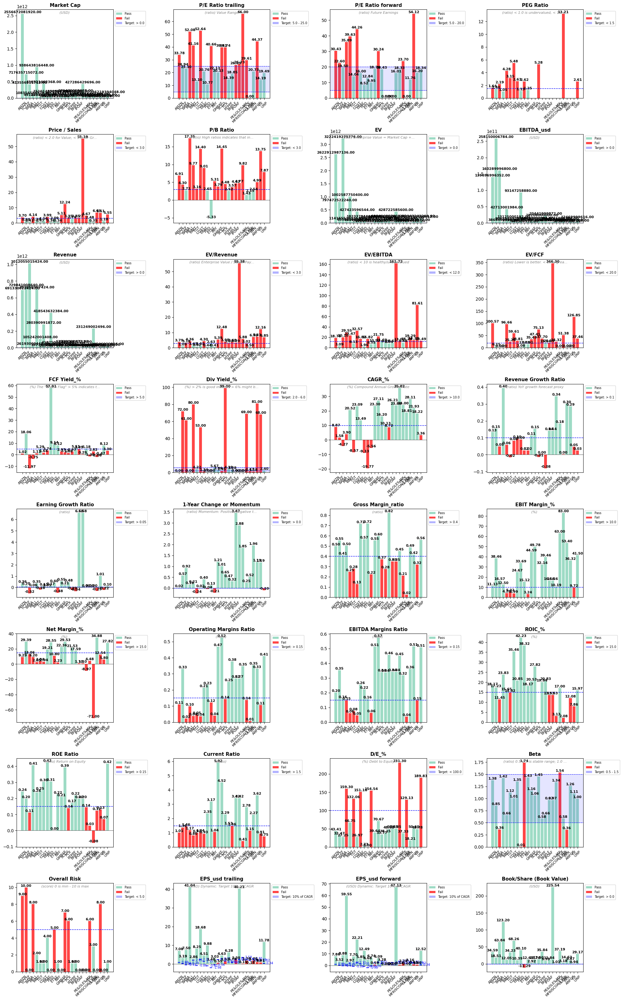

In [ ]:
# Plot financial Ratios
functions.plot_ratios(fa_df, metrics_config, plots_per_row=3)

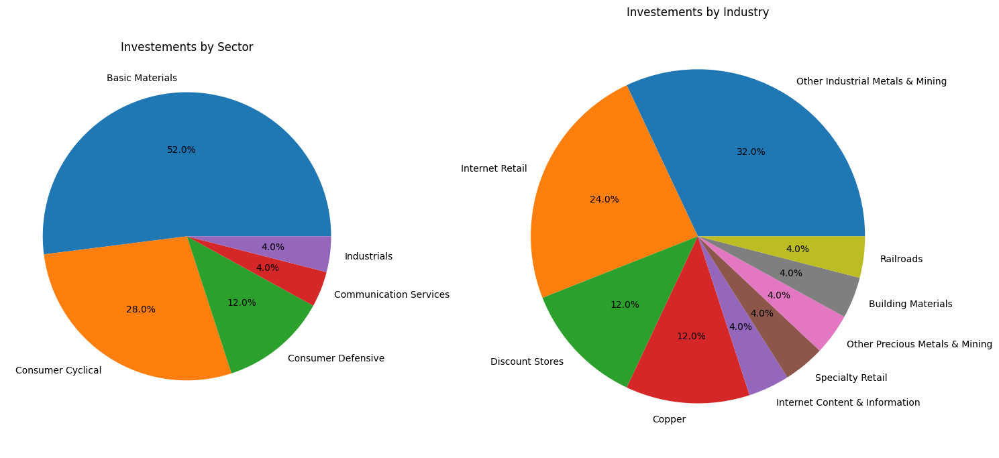

In [9]:
# Sectors and Industries
functions.print_sector_industry(fa_df)

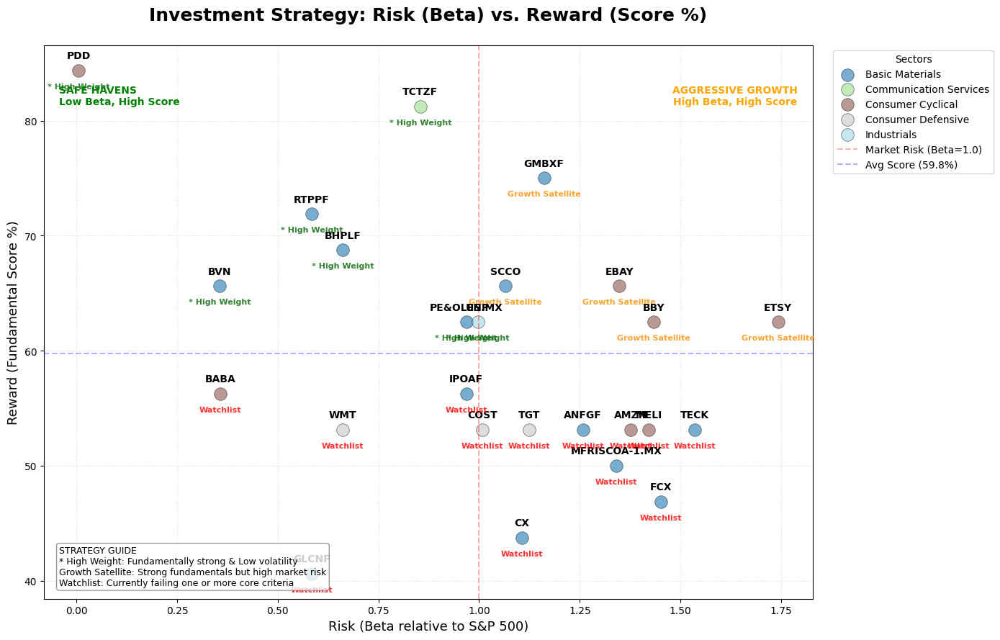

In [10]:
# --- SCORE vs BETA by Sector ---
functions.plot_risk_reward(fa_df, metrics_config)

In [11]:
# --- TOP N assets in all sectors ---

# 1. Get the Top 10 assets (in long format)
top_N_data = functions.get_top_N_assets(fa_df, metrics_config, top_n=10)
# 2. Plot the Treemap (using the existing plot_sector_treemap function)
functions.plot_sector_treemap(top_N_data)

# Grouping the top 5 to see the distribution
summary = top_N_data.groupby(['Sector', 'Industry', 'Name', 'Ticker'])[['Score %']].max().sort_values('Score %', ascending=False)

# Display the summary table
display(summary.style.background_gradient(cmap='Greens'))


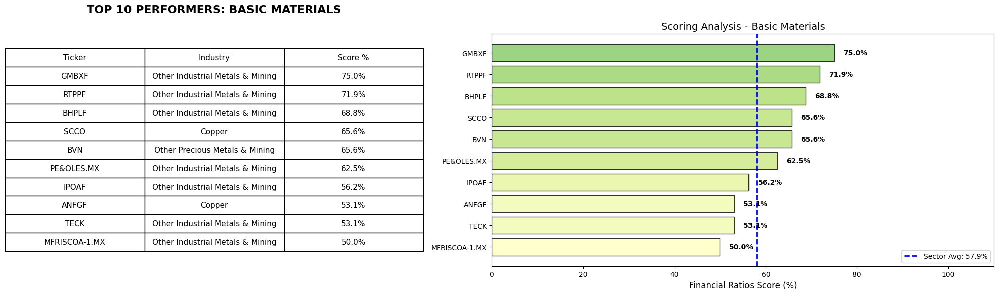

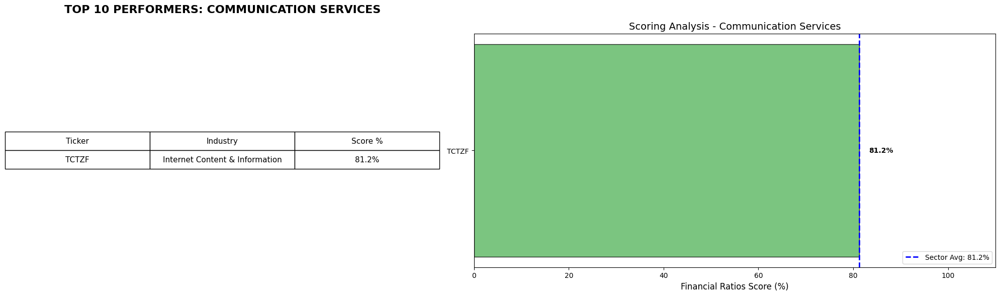

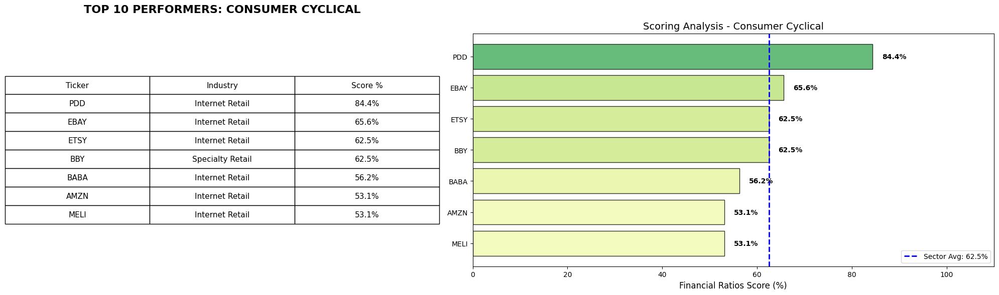

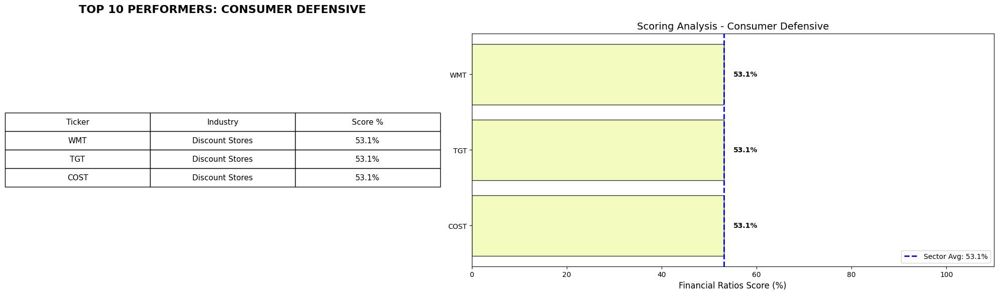

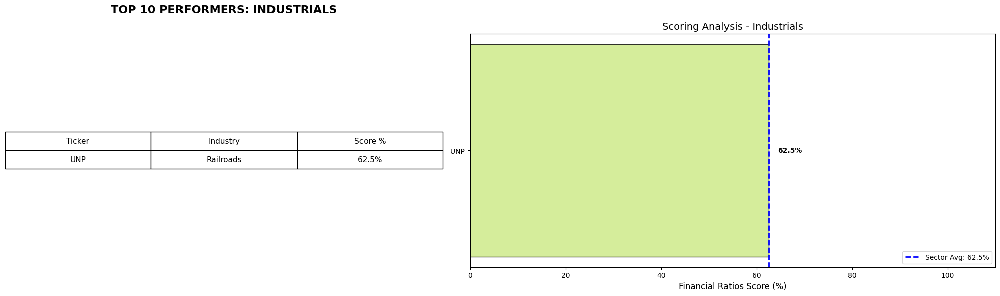

In [12]:
# TOP N BY SECTOR AND INDUSTRY

functions.top_N_sector_industry(fa_df, metrics_config, n_per_sector=10)



In [13]:
# TOP 1 BY SECTOR

final_picks = functions.top_1_sector(fa_df, metrics_config)
print("\n--- FINAL BEST-IN-CLASS PORTFOLIO SELECTION ---")
print("--- TOP 1 BY SECTOR ---")
display(final_picks.style.hide(axis="index").background_gradient(subset=['Score %'], cmap='RdYlGn'))



--- FINAL BEST-IN-CLASS PORTFOLIO SELECTION ---
--- TOP 1 BY SECTOR ---


Sector,Industry,Ticker,Score %
Consumer Cyclical,Internet Retail,PDD,84.375000
Communication Services,Internet Content & Information,TCTZF,81.250000
Basic Materials,Other Industrial Metals & Mining,GMBXF,75.000000
Industrials,Railroads,UNP,62.500000
Consumer Defensive,Discount Stores,WMT,53.125000


In [14]:
comparison_table = functions.display_combined_strategy_comparison(fa_df, metrics_config, top_n=10)
display(comparison_table)

--- STRATEGY COMPARISON MATRIX ---


,All Assets,Top 10 Overall,Best-in-Class (Sector)
Total Tickers,25,10,5
Avg Score_%,59.8%,70.3%,71.2%
Avg Beta,1.01,0.88,0.74
Character,MARKET-NEUTRAL,MARKET-NEUTRAL,CONSERVATIVE / DEFENSIVE
Included Tickers,"PDD, TCTZF, GMBXF, RTPPF, BHPLF, SCCO, EBAY, BVN, ETSY, UNP, BBY, PE&OLES.MX, IPOAF, BABA, AMZN, MELI, WMT, TGT, COST, ANFGF, TECK, MFRISCOA-1.MX, FCX, CX, GLCNF","PDD, TCTZF, GMBXF, RTPPF, BHPLF, SCCO, EBAY, BVN, ETSY, UNP","PDD, TCTZF, GMBXF, UNP, WMT"


Dividends, Splits and Recommendations

Gathering intelligence for 25 tickers...


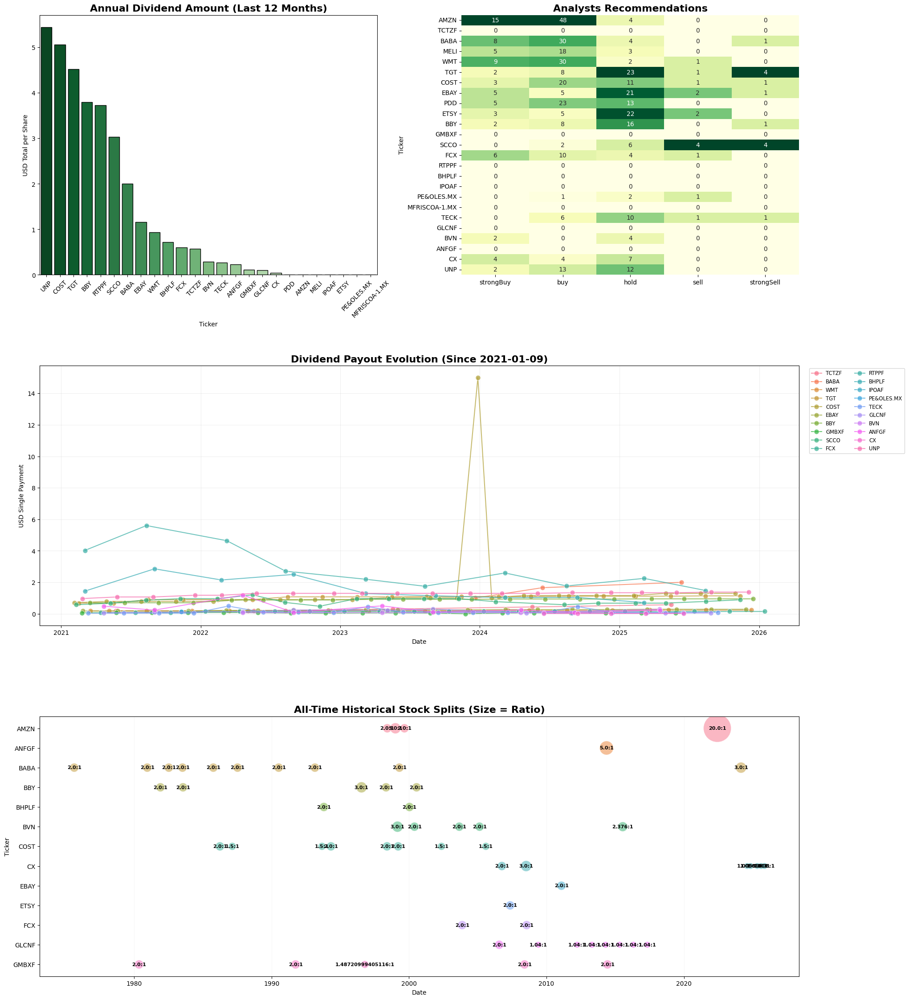

In [15]:
functions.print_dividends_splits_recommendations(tickers, start_date, today)

# Quantitative Analysis ALL Tickets

## Import Prices from yfinance (All Tickers)

**[TS302_Stock Full Analysis.ipynb](<../TS302_Stock Full Analysis.ipynb>)**

In [16]:
# import data from yahoo Finance
print(f"Number of days since Brokerage account was opened: {no_days}")
df = yf.download(tickers, start=start_date, end=today, auto_adjust=True)
df.info()

[                       0%                       ]

Number of days since Brokerage account was opened: 1843 days, 0:00:00


[*********************100%***********************]  25 of 25 completed


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1304 entries, 2021-01-11 to 2026-01-23
Columns: 125 entries, ('Close', 'AMZN') to ('Volume', 'WMT')
dtypes: float64(125)
memory usage: 1.3 MB


## Prices (Close)

In [17]:
prices_raw = df["Close"]
print('-- Last 5 days of prices --')
display(prices_raw.tail(5))


-- Last 5 days of prices --


Ticker,AMZN,ANFGF,BABA,BBY,BHPLF,BVN,COST,CX,EBAY,ETSY,...,MFRISCOA-1.MX,PDD,PE&OLES.MX,RTPPF,SCCO,TCTZF,TECK,TGT,UNP,WMT
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.47,NaN,1082.010010,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2026-01-20,231.000000,48.889999,162.389999,65.830002,32.310001,37.590000,964.260010,12.49,90.699997,58.930000,...,9.50,104.459999,1115.969971,85.000000,186.250000,76.239998,50.209999,109.339996,221.690002,118.709999
2026-01-21,231.309998,48.810001,168.669998,66.559998,32.869999,37.029999,982.859985,12.92,92.820000,60.990002,...,9.92,105.919998,1085.000000,87.660004,184.059998,77.029999,53.000000,106.040001,229.389999,119.360001
2026-01-22,234.339996,47.650002,177.179993,67.059998,32.709999,36.509998,976.169983,12.99,93.879997,62.490002,...,9.92,106.019997,1067.890015,87.269997,176.410004,76.430000,51.240002,106.500000,231.369995,117.830002
2026-01-23,239.160004,49.250000,173.229996,67.050003,33.560001,37.099998,983.250000,12.91,93.610001,60.169998,...,9.90,106.379997,1075.000000,90.389999,184.300003,79.550003,53.009998,108.099998,229.649994,117.730003


In [18]:
# drop NaN (days without price)
prices = prices_raw.dropna()
display(prices.tail(5))



Ticker,AMZN,ANFGF,BABA,BBY,BHPLF,BVN,COST,CX,EBAY,ETSY,...,MFRISCOA-1.MX,PDD,PE&OLES.MX,RTPPF,SCCO,TCTZF,TECK,TGT,UNP,WMT
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-16,239.119995,48.000000,165.399994,67.760002,33.000000,34.680000,963.609985,12.49,93.029999,61.770000,...,9.44,106.760002,1069.000000,85.330002,180.949997,78.809998,50.540001,111.279999,229.490005,119.699997
2026-01-20,231.000000,48.889999,162.389999,65.830002,32.310001,37.590000,964.260010,12.49,90.699997,58.930000,...,9.50,104.459999,1115.969971,85.000000,186.250000,76.239998,50.209999,109.339996,221.690002,118.709999
2026-01-21,231.309998,48.810001,168.669998,66.559998,32.869999,37.029999,982.859985,12.92,92.820000,60.990002,...,9.92,105.919998,1085.000000,87.660004,184.059998,77.029999,53.000000,106.040001,229.389999,119.360001
2026-01-22,234.339996,47.650002,177.179993,67.059998,32.709999,36.509998,976.169983,12.99,93.879997,62.490002,...,9.92,106.019997,1067.890015,87.269997,176.410004,76.430000,51.240002,106.500000,231.369995,117.830002
2026-01-23,239.160004,49.250000,173.229996,67.050003,33.560001,37.099998,983.250000,12.91,93.610001,60.169998,...,9.90,106.379997,1075.000000,90.389999,184.300003,79.550003,53.009998,108.099998,229.649994,117.730003


In [19]:
print(f"prices_raw shape: {prices_raw.shape}")
print(f"prices shape: {prices.shape}")

if len(prices) < len(prices_raw):
    print(f"Reduction of {(len(prices_raw) - len(prices))}")
    print(f"It can be noticed that the amount of rows in the dataframe dropped from {len(prices_raw)} to {len(prices)} after the drop.na() operation. This is because there are a couple of assets that are relatively new in the public market (post IPO).")


prices_raw shape: (1304, 25)
prices shape: (1230, 25)
Reduction of 74
It can be noticed that the amount of rows in the dataframe dropped from 1304 to 1230 after the drop.na() operation. This is because there are a couple of assets that are relatively new in the public market (post IPO).


In [20]:
print(f"Reminder: the original 'start_date' was: {start_date.date().strftime("%B %d, %Y")}, when the original portfolio was created.")

df_ = df['Close']
first_valid_dates = df_.apply(pd.Series.first_valid_index)
first_valid_dates.name = "First Valid Date"
first_valid_dates = first_valid_dates.sort_values(ascending=False)


print(f"\nThe asset with the smallest amount of data available is: '{first_valid_dates.index[0]}' starting from '{first_valid_dates.iloc[0].date().strftime("%B %d, %Y")}' only.")

print("\nOldest available dates for each asset:")
display(first_valid_dates)



Reminder: the original 'start_date' was: January 09, 2021, when the original portfolio was created.

The asset with the smallest amount of data available is: 'AMZN' starting from 'January 11, 2021' only.

Oldest available dates for each asset:


Ticker
AMZN            2021-01-11
IPOAF           2021-01-11
UNP             2021-01-11
TGT             2021-01-11
TECK            2021-01-11
TCTZF           2021-01-11
SCCO            2021-01-11
RTPPF           2021-01-11
PE&OLES.MX      2021-01-11
PDD             2021-01-11
MFRISCOA-1.MX   2021-01-11
MELI            2021-01-11
GMBXF           2021-01-11
ANFGF           2021-01-11
GLCNF           2021-01-11
FCX             2021-01-11
ETSY            2021-01-11
EBAY            2021-01-11
CX              2021-01-11
COST            2021-01-11
BVN             2021-01-11
BHPLF           2021-01-11
BBY             2021-01-11
BABA            2021-01-11
WMT             2021-01-11
Name: First Valid Date, dtype: datetime64[ns]

In [21]:
# -- PLOT ASSET PRICES --
functions.plot_prices(prices=prices, yaxis_label="Price (USD)")


## Stats (describe)



In [22]:
# statistics about prices
prices.describe()

Ticker,AMZN,ANFGF,BABA,BBY,BHPLF,BVN,COST,CX,EBAY,ETSY,...,MFRISCOA-1.MX,PDD,PE&OLES.MX,RTPPF,SCCO,TCTZF,TECK,TGT,UNP,WMT
count,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,...,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000,1230.000000
mean,164.354036,21.210110,115.555419,75.904469,24.964460,11.663407,639.686439,6.565919,56.310972,105.777602,...,3.573353,101.487854,317.800287,57.374465,74.683683,54.105828,36.061747,145.313573,213.024399,61.867719
std,40.959188,6.578329,46.699933,11.740066,2.739939,5.490087,222.474643,1.765250,15.260422,59.270420,...,1.572054,33.281379,166.355990,6.870193,26.919095,15.572600,8.798745,38.267614,18.471420,22.587777
min,81.820000,10.855844,59.973244,53.840054,17.977417,5.076231,295.239777,3.145845,34.575481,40.799999,...,2.044787,25.530001,156.960007,41.523735,36.804161,25.059639,16.842655,83.680000,172.714157,37.706768
25%,132.385002,17.275247,81.025602,66.728325,23.485851,7.568435,467.853271,5.460406,42.571525,60.284999,...,2.750000,74.117502,235.219994,54.021899,52.958960,41.574495,30.695944,120.253490,197.105724,44.870985
50%,166.223999,19.726736,97.619762,73.258446,25.176954,9.848488,535.701508,6.464447,53.067327,81.790001,...,3.300000,102.980003,267.382599,57.533764,66.424053,49.126654,37.897331,140.977272,216.873360,50.289236
75%,188.747498,23.780851,137.454430,84.150694,26.798671,14.804520,883.076050,7.677828,65.004192,134.642498,...,3.680000,125.764999,300.989891,60.730000,93.348534,64.538761,42.139785,164.223763,228.584793,80.338800
max,254.000000,49.549999,257.205902,113.575539,33.560001,37.590000,1072.453613,12.990000,100.101929,296.910004,...,10.230000,202.820007,1115.969971,90.389999,186.250000,96.284836,53.656742,235.044678,253.375244,120.360001


## Normalized Prices

**Normalize to 100**

**Normalizar** precios de diferentes **magnitudes** dividiendo entre el primer registro. Todos los precios parten del mismo punto que es el 100.


$$
\frac {P_t}{P_0} * 100
$$

Nota: esto ya no es mas el Precio al Cierre sino un indice de crecimiento en el tiempo.

In [23]:
# Normalized Prices

prices_normalized = (prices / prices.iloc[0]) * 100


# -- PLOT ASSET PRICES --
functions.plot_prices(prices=prices_normalized, yaxis_label="Price (USD)")


## Daily Returns

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**


Normal (simple or arithmetic) returns:

$$Return(R_t) = \frac{P_t - P_{t-1}}{P_{t-1}} = \frac {P_t}{P_{t-1}} -1 $$

In [24]:
# Daily Returns. Using pct_change()
# Normal (simple or arithmetic) returns
# Expresed in FRACTION.
# If Percentage is needed then multiply by 100.
daily_returns = prices.pct_change(fill_method=None)
daily_returns = daily_returns.dropna()
daily_returns.tail(5)

Ticker,AMZN,ANFGF,BABA,BBY,BHPLF,BVN,COST,CX,EBAY,ETSY,...,MFRISCOA-1.MX,PDD,PE&OLES.MX,RTPPF,SCCO,TCTZF,TECK,TGT,UNP,WMT
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-16,0.003947,-0.031282,-0.032352,-0.005577,0.000000,-0.006304,0.007170,0.011336,-0.031644,-0.029232,...,0.016146,-0.006514,0.018580,0.000000,-0.011040,-0.045306,-0.033097,0.001350,-0.004425,0.004195
2026-01-20,-0.033958,0.018542,-0.018198,-0.028483,-0.020909,0.083910,0.000675,0.000000,-0.025046,-0.045977,...,0.006356,-0.021544,0.043938,-0.003867,0.029290,-0.032610,-0.006530,-0.017434,-0.033988,-0.008271
2026-01-21,0.001342,-0.001636,0.038672,0.011089,0.017332,-0.014898,0.019289,0.034428,0.023374,0.034957,...,0.044211,0.013977,-0.027752,0.031294,-0.011758,0.010362,0.055567,-0.030181,0.034733,0.005476
2026-01-22,0.013099,-0.023766,0.050454,0.007512,-0.004868,-0.014043,-0.006807,0.005418,0.011420,0.024594,...,0.000000,0.000944,-0.015770,-0.004449,-0.041563,-0.007789,-0.033208,0.004338,0.008632,-0.012818
2026-01-23,0.020568,0.033578,-0.022294,-0.000149,0.025986,0.016160,0.007253,-0.006159,-0.002876,-0.037126,...,-0.002016,0.003396,0.006658,0.035751,0.044725,0.040822,0.034543,0.015023,-0.007434,-0.000849


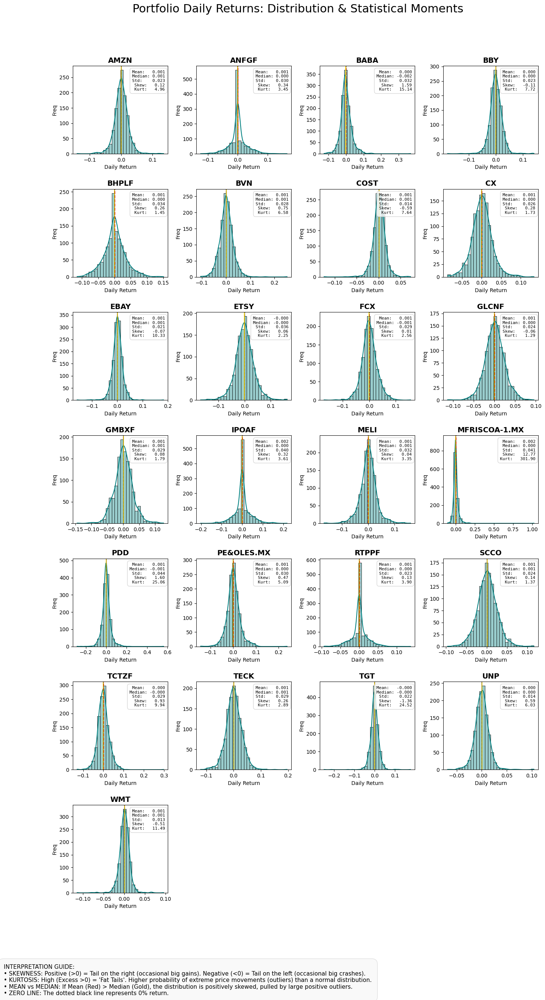


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
MFRISCOA-1.MX,0.0019,0.0000,0.0415,12.7693,301.9029
PDD,0.0006,-0.0006,0.0441,1.6000,25.0634
TGT,-0.0001,-0.0001,0.0224,-1.3562,24.5214
BABA,0.0003,-0.0022,0.0324,1.5872,15.1411
WMT,0.0009,0.0012,0.0133,-0.5121,11.4906
EBAY,0.0007,0.0009,0.0207,-0.0703,10.3328
TCTZF,0.0005,-0.0005,0.0289,0.9325,9.9428
BBY,0.0000,0.0000,0.0235,-0.1136,7.7191
COST,0.0010,0.0010,0.0144,-0.5876,7.6399


In [25]:
results_df = functions.plot_returns_distributions(daily_returns, num_cols=4)

In [26]:
# -- PLOT DAILY RETURNS --
functions.plot_daily_returns(daily_returns)

## Summary of Daily Returns

In [27]:
# stats and summary of daily retutns
print(f"Number of days of evaluation: {(today - daily_returns.index[0]).days}")
print(f"since {daily_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

max_daily_return = daily_returns.describe().loc['max'].sort_values(ascending=False)
print(f"\nThe asset with the biggest Return in a single day is '{max_daily_return.index[0]}' with {100*max_daily_return.iloc[0]:,.5}%")

min_daily_return = daily_returns.describe().loc['min'].sort_values(ascending=True)
print(f"The asset with the lowest Return in a single day is '{min_daily_return.index[0]}' with {100*min_daily_return.iloc[0]:,.5}%")

average_daily_returns = daily_returns.mean()
print(f"The average of all Daily Returns is {average_daily_returns.mean()*100:,.4}%")

max_std = daily_returns.describe().loc['std'].sort_values(ascending=False)
print(f"\nThe asset with the biggest StdDev in Daily Returns is '{max_std.index[0]}' with {100*max_std.iloc[0]:,.5}%")
print(f"The asset with the smallest StdDev in Daily Returns is '{max_std.index[-1]}' with {100*max_std.iloc[-1]:,.5}%")

Number of days of evaluation: 1840
since January 12, 2021 until January 26, 2026

The asset with the biggest Return in a single day is 'MFRISCOA-1.MX' with 102.4%
The asset with the lowest Return in a single day is 'PDD' with -28.505%
The average of all Daily Returns is 0.085%

The asset with the biggest StdDev in Daily Returns is 'PDD' with 4.4088%
The asset with the smallest StdDev in Daily Returns is 'WMT' with 1.3291%


## Annualized Returns

In [28]:
# Annualized Returns
annualized_return_tickers = daily_returns.mean() * 250
annualized_return_tickers.name = "Annualized Returns:"
annualized_return_tickers = annualized_return_tickers.sort_values(ascending=False)
print("Annualized Returns (%):")
print(f"{round(annualized_return_tickers, 2)* 100}")


Annualized Returns (%):
Ticker
MFRISCOA-1.MX    48.0
IPOAF            44.0
BVN              35.0
PE&OLES.MX       33.0
TECK             33.0
SCCO             32.0
GMBXF            32.0
ANFGF            31.0
FCX              26.0
CX               26.0
GLCNF            25.0
COST             24.0
BHPLF            23.0
WMT              21.0
EBAY             18.0
MELI             17.0
RTPPF            16.0
AMZN             15.0
PDD              14.0
TCTZF            12.0
BABA              8.0
UNP               6.0
BBY               1.0
TGT              -3.0
ETSY             -7.0
Name: Annualized Returns:, dtype: float64


## Cumulative Returns in Period

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**

In [29]:
# cumprod(): calculates the total return over a period by compounding the daily returns. (a)(ab)(abc)
# It reflects how an initial investment would grow if it were continuously reinvested and earned the daily returns.
cumulative_returns = (1 + daily_returns).cumprod()
cumulative_returns = (cumulative_returns - 1)*100
print("Cumulative Returns in %:")
cumulative_returns.tail(5)

Cumulative Returns in %:


Ticker,AMZN,ANFGF,BABA,BBY,BHPLF,BVN,COST,CX,EBAY,ETSY,...,MFRISCOA-1.MX,PDD,PE&OLES.MX,RTPPF,SCCO,TCTZF,TECK,TGT,UNP,WMT
Date,,,,,,,,,,,,,,,,,,,,,
2026-01-16,53.567038,165.252818,-23.401871,-24.277397,50.008375,226.505183,179.779788,125.266173,88.239519,-66.253276,...,347.406056,-38.106558,192.901104,53.685649,229.633384,7.238367,182.521617,-34.528872,18.088662,160.947971
2026-01-20,48.352235,170.171044,-24.795825,-26.434195,46.871843,253.902243,179.968520,125.266173,83.524927,-67.804850,...,350.249759,-39.439970,205.770661,53.091292,239.288305,3.741317,180.676887,-35.670264,14.075015,158.789759
2026-01-21,48.551321,169.728967,-21.887505,-25.618416,49.417429,248.629943,185.368938,133.021539,87.814600,-66.679412,...,370.155541,-38.593545,197.285030,57.882155,235.298817,4.816287,196.273159,-37.611803,18.037202,160.206773
2026-01-22,50.497239,163.318692,-17.946455,-25.059660,48.690116,243.734244,183.426527,134.284035,89.959429,-65.859919,...,370.155541,-38.535571,192.596973,57.179724,221.362959,3.999857,186.434663,-37.341164,19.056048,156.871351
2026-01-23,53.592732,172.160444,-19.775731,-25.070829,52.553978,249.288976,185.482177,132.841178,89.413111,-67.127404,...,369.207626,-38.326863,194.545076,62.799079,235.736031,8.245308,196.329050,-36.399812,18.170987,156.653352


In [30]:
# -- PLOT CUMULATIVE RETURNS --
functions.plot_cumulative_returns(cumulative_returns)

## Final Cumulated Returns in Period

In [31]:
# Rendimientos Acumulados al Final del Tiempo en (%) use .prod() y -1
print(f"Final Cumulative Returns in (%) in {(today - daily_returns.index[0]).days} days of evaluation: ")
print(f"since {daily_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

cumulative_returns_final = cumulative_returns.iloc[-1]
cumulative_returns_final.name = "Final Cumulative Returns (%)"
cumulative_returns_final = round(cumulative_returns_final.sort_values(ascending=False) , 1)
print("Final Cumulative Returns in %:")
display(cumulative_returns_final.all)

Final Cumulative Returns in (%) in 1840 days of evaluation: 
since January 12, 2021 until January 26, 2026
Final Cumulative Returns in %:


<bound method Series.all of Ticker
MFRISCOA-1.MX    369.2
BVN              249.3
SCCO             235.7
IPOAF            223.9
TECK             196.3
PE&OLES.MX       194.5
GMBXF            187.9
COST             185.5
ANFGF            172.2
WMT              156.7
GLCNF            138.7
CX               132.8
FCX              113.4
EBAY              89.4
RTPPF             62.8
AMZN              53.6
BHPLF             52.6
MELI              21.3
UNP               18.2
TCTZF              8.2
BABA             -19.8
BBY              -25.1
TGT              -36.4
PDD              -38.3
ETSY             -67.1
Name: Final Cumulative Returns (%), dtype: float64>

## Summary Final Cumulated Returns

In [32]:

print(f"Number of days of evaluation (period): {(today - cumulative_returns.index[0]).days}")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"The asset with the best cumulated return in the Period '{cumulative_returns_final.index[0]}' with {cumulative_returns_final.iloc[0]:,.5}% in the period")
print(f"The asset with the worst cumulative return in the Period '{cumulative_returns_final.index[-1]}' with {cumulative_returns_final.iloc[-1]:,.5}% in the period")

Number of days of evaluation (period): 1840
From January 12, 2021 until January 26, 2026
The asset with the best cumulated return in the Period 'MFRISCOA-1.MX' with 369.2% in the period
The asset with the worst cumulative return in the Period 'ETSY' with -67.1% in the period


## Risk, Annualized Volatility

**[TS303_yfinance Indices Bursatiles.ipynb](<../TS303_yfinance Indices Bursatiles.ipynb>)**

Asset Volatility (risk or std)

$$
\sigma = risk = \sqrt{\frac {\sum(r - \bar{r})^2}{n-1}}
$$

In [33]:
# Yearly volatility (risk)

# StdDev of daily returns in a 252-days year
annualized_volatility = daily_returns.std() * np.sqrt(252)

# Percentage (%)
annualized_volatility_percent = annualized_volatility * 100

# DataFrame of Annualized Volatility
volatility_df = pd.DataFrame(annualized_volatility_percent, columns=["Volatility (%)"])

print("Annualized Assets Volatility:")

volatility_df = round(volatility_df.sort_values(by="Volatility (%)", ascending=False), 2)

display(volatility_df)

Annualized Assets Volatility:


,Volatility (%)
Ticker,
PDD,69.99
MFRISCOA-1.MX,65.81
IPOAF,64.27
ETSY,56.90
BHPLF,54.12
BABA,51.50
MELI,50.47
ANFGF,47.37
PE&OLES.MX,46.91


Stats of Volatility

In [34]:
display(volatility_df.describe()) # all stocks

,Volatility (%)
count,25.000000
mean,43.881600
std,12.650072
min,21.100000
25%,35.890000
50%,45.490000
75%,50.470000
max,69.990000


## Summary Risk, Volatility

In [35]:
# summary and stats

print(f"Number of days of evaluation: {(today - cumulative_returns.index[0]).days}")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"The asset with the biggest Annualized Volatility is '{volatility_df.index[0]}' with a {volatility_df.iloc[0].values[0]:,.5} %")
print(f"The asset with the lowest Annualized Volatility is '{volatility_df.index[-1]}' with a {volatility_df.iloc[-1].values[0]:,.5} %")
print(f"The Average Annualized Volatility of all assets is: {volatility_df.mean().values[0]:,.5} %")

Number of days of evaluation: 1840
From January 12, 2021 until January 26, 2026
The asset with the biggest Annualized Volatility is 'PDD' with a 69.99 %
The asset with the lowest Annualized Volatility is 'WMT' with a 21.1 %
The Average Annualized Volatility of all assets is: 43.882 %


## Dividend Yields (%)

In [36]:
# ANNUAL DIVIDEND YIELDS
yields = functions.plot_annual_dividnd_yields(daily_returns)

Annual Dividend Yields from yf 'dividendYield' (%):


AMZN             0.00
ANFGF            0.81
BABA             0.61
BBY              5.67
BHPLF            3.28
BVN              1.18
COST             0.53
CX               0.68
EBAY             1.24
ETSY             0.00
FCX              0.99
GLCNF            1.47
GMBXF            2.96
IPOAF            0.00
MELI             0.00
MFRISCOA-1.MX    0.00
PDD              0.00
PE&OLES.MX       0.00
RTPPF            4.19
SCCO             1.95
TCTZF            0.72
TECK             0.69
TGT              4.22
UNP              2.40
WMT              0.80
Name: dividendYield, dtype: float64

# Initial Portfolio (Original)

## Assets Weights

Compute Assets weights from the original portfolio

In [37]:
# call the original portfolio [Ticker, Current QTY]
file_df

# Close prices df
close_prices = prices.iloc[-1]
close_prices.name = "Close Price"

# Merge original df with Close Prices
weights_df = pd.merge(file_df, close_prices, on='Ticker', how='inner')

# Add column of Amount Invested for each asset
weights_df['Investment'] = weights_df["Current QTY"] * weights_df["Close Price"]

# Calculate the Total Invested
Total_invested = weights_df['Investment'].sum()
print(f"Total Invested: ${Total_invested:,.2f}")

# Add column of weights of each asset
weights_df['Weights'] = weights_df['Investment'] / Total_invested
print(f"The sum of the weights is: {weights_df['Weights'].sum()}")

weights_df.set_index('Ticker', inplace=True)
weights_df.sort_values(by='Investment', ascending=False, inplace=True)
print("Sorted by Invested amount ($):")
display(round(weights_df, 2))


Total Invested: $65,516.86
The sum of the weights is: 1.0000000000000002
Sorted by Invested amount ($):


,Current QTY,Close Price,Investment,Weights
Ticker,,,,
MELI,2.43,2137.29,5193.61,0.08
GMBXF,452.90,11.07,5013.60,0.08
COST,5.09,983.25,5004.74,0.08
ETSY,83.10,60.17,5000.13,0.08
WMT,42.47,117.73,4999.99,0.08
BBY,74.57,67.05,4999.92,0.08
PDD,47.00,106.38,4999.86,0.08
TCTZF,62.85,79.55,4999.72,0.08
EBAY,53.41,93.61,4999.71,0.08


TO-DO: Grafica de Pastel con los Porcentajes

Grafica por Sectores, Industrias

## Portfolio Daily Returns

In [38]:
#checking the shapes of the objects to multiply
# Daily Returns Expresed in FRACTION.
print("Portfolio daily returns = [Daily Returns] x [weights]")
print(f"daily_returns shape: {daily_returns.shape}")
print(f"weights_df shape: {weights_df['Weights'].shape}")
print(f"Matrix multiplication [{daily_returns.shape[0]} x {daily_returns.shape[1]}] x [{weights_df['Weights'].shape[0]} x 1] = [{daily_returns.shape[0]} x 1]")

Portfolio daily returns = [Daily Returns] x [weights]
daily_returns shape: (1229, 25)
weights_df shape: (25,)
Matrix multiplication [1229 x 25] x [25 x 1] = [1229 x 1]


In [39]:
# option 1: Portfolio's Daily Returns: Matrix multiplication (see above)
portfolio_daily_returns = (daily_returns @ weights_df['Weights'])

# option 2: Portfolio's Daily Returns: weighted sum of the daily returns of each asset
# portfolio_daily_returns = (daily_returns * weights_df['Weights']).sum(axis=1)


portfolio_daily_returns.name = 'portfolio daily returns'
print("portfolio_daily_returns:")
display(portfolio_daily_returns) # Expresed in FRACTION (not percentage)

portfolio_daily_returns:


Date
2021-01-12    0.017662
2021-01-13    0.000896
2021-01-14    0.007991
2021-01-15   -0.013240
2021-01-19    0.021113
                ...   
2026-01-16   -0.010046
2026-01-20   -0.014926
2026-01-21    0.009496
2026-01-22    0.010997
2026-01-23    0.000308
Name: portfolio daily returns, Length: 1229, dtype: float64

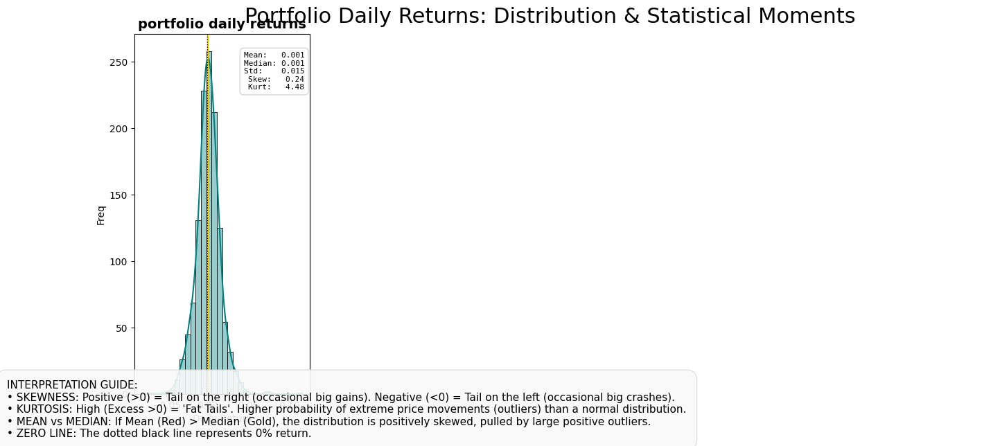


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
portfolio daily returns,0.0006,0.0009,0.0151,0.2364,4.4781


In [40]:
results_df = functions.plot_returns_distributions(pd.DataFrame(portfolio_daily_returns), num_cols=4)

In [41]:
# -- PLOT DAILY RETURNS --
functions.plot_daily_returns(pd.DataFrame(portfolio_daily_returns))

## Portfolio Annualized Returns

In [42]:
# Annualized Returns
annualized_return_portfolio = portfolio_daily_returns.mean() * 250
print("Annualized Returns (%):")
print(f"{round(annualized_return_portfolio, 2) * 100}%")

Annualized Returns (%):
15.0%


## Portfolio Cumulative Returns

In [43]:
# Portfolio's Cumulative daily Returns
portfolio_cumulative_returns = (1 + portfolio_daily_returns).cumprod()
portfolio_cumulative_returns = (portfolio_cumulative_returns - 1) * 100
portfolio_cumulative_returns = portfolio_cumulative_returns.rename('portfolio cumulative returns')
print("Portfolio Daily Cumulative Returns:")
display(portfolio_cumulative_returns)

Portfolio Daily Cumulative Returns:


Date
2021-01-12     1.766211
2021-01-13     1.857440
2021-01-14     2.671424
2021-01-15     1.312023
2021-01-19     3.450989
                ...    
2026-01-16    78.932457
2026-01-20    76.261716
2026-01-21    77.935516
2026-01-22    79.892332
2026-01-23    79.947690
Name: portfolio cumulative returns, Length: 1229, dtype: float64

In [44]:
# -- PLOT CUMULATIVE RETURNS --
functions.plot_cumulative_returns(pd.DataFrame(portfolio_cumulative_returns))

Portfolio Cumulative Final

In [45]:
# Portfolio's final comulated return
portafolio_cumulative_final = portfolio_cumulative_returns.iloc[-1]
print(f"portafolio_cumulative Returns_final: {portafolio_cumulative_final:,.4}%")

portafolio_cumulative Returns_final: 79.95%


## Portfolio Volatility (Annualized)

In [46]:
# Compute annualized Volatility of the Portfolio
portfolio_annualized_volatility = portfolio_daily_returns.std() * np.sqrt(252)

# Convert to percentage
portfolio_annualized_volatility_perc = portfolio_annualized_volatility * 100

print(f"Portfolio Annualized Volatility: {portfolio_annualized_volatility_perc:,.4}%")

Portfolio Annualized Volatility: 23.97%


## Portfolio Sharpe Ratio

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$ (average rate of return)
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev) Standard Deviation of the portfolio's excess return.

In [47]:
portfolio_annualized_return = portfolio_daily_returns.mean()*252 #Annualized
portfolio_sr = round((portfolio_annualized_return - (risk_free))/portfolio_annualized_volatility, 2)
print(f"Portfolio Sharpe Ratio: {portfolio_sr}")

Portfolio Sharpe Ratio: 0.48


## Summary

In [48]:
print(f"Number of days of evaluation: {(today - cumulative_returns.index[0]).days} days")
print(f"From {cumulative_returns.index[0].date().strftime("%B %d, %Y")} until {today.date().strftime("%B %d, %Y")}")

print(f"\nTotal Invested: ${Total_invested:,.2f}")
print(f"Portafolio_cumulative returns_final (all period): {portafolio_cumulative_final:,.4}%")
print(f"Portfolio Annualized Average Returns: {portfolio_annualized_return:,.4%}")
print(f"Portfolio Annualized Volatility: {portfolio_annualized_volatility_perc:,.4}%")
print(f"Portfolio Sharpe Ratio: {portfolio_sr}")



Number of days of evaluation: 1840 days
From January 12, 2021 until January 26, 2026

Total Invested: $65,516.86
Portafolio_cumulative returns_final (all period): 79.95%
Portfolio Annualized Average Returns: 14.9124%
Portfolio Annualized Volatility: 23.97%
Portfolio Sharpe Ratio: 0.48


# Benchmarks (Indices)

## Daily Index Levels

In [49]:
# Benchmark Indices
benchmark_indices = {
    "EE.UU. (S&P 500)": "^GSPC",
    "EE.UU. (NASDAQ)": "^IXIC",
    "EE.UU. (DJIA)": "^DJI",
    "EE.UU. (Russell 100)": "^RUI",
    "México (IPC)": "^MXX",
    "Japón (Nikkei 225)": "^N225",
    "Alemania (DAX)": "^GDAXI",
    "Reino Unido (FTSE 100)": "^FTSE"
}

# get data from yahoo finance
benchmarks_prices = yf.download(list(benchmark_indices.values()), start=first_valid_dates.iloc[0], end=today, auto_adjust=True)["Close"]

# Rename columns
benchmarks_prices.columns = list(benchmark_indices.keys())

print("Benchmark Indices levels:")
display(benchmarks_prices.tail(5))

[*********************100%***********************]  8 of 8 completed

Benchmark Indices levels:


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-19,NaN,10195.400391,24959.060547,NaN,NaN,67467.820312,53583.570312,NaN
2026-01-20,48488.589844,10126.799805,24703.119141,6796.859863,22954.320312,67683.382812,52991.101562,3715.270020
2026-01-21,49077.230469,10138.099609,24560.980469,6875.620117,23224.820312,68036.132812,52774.640625,3758.199951
2026-01-22,49384.011719,10150.099609,24856.470703,6913.350098,23436.019531,68347.976562,53688.890625,3778.750000
2026-01-23,49098.710938,10143.400391,24900.710938,6915.609863,23501.240234,68195.148438,53846.871094,3777.739990


In [50]:
# -- PLOT ASSET PRICES --
functions.plot_prices(prices=benchmarks_prices, yaxis_label="Index Level")

## Normalized Index Levels

In [51]:
# Normalized Index Levels
benchmarks_prices_normalized = (benchmarks_prices / benchmarks_prices.iloc[0]) * 100

# -- PLOT ASSET PRICES --
functions.plot_prices(prices=benchmarks_prices_normalized, yaxis_label="Index Level")

## Daily Returns

In [52]:
# Daily Returns
daily_returns_bm = benchmarks_prices.pct_change(fill_method=None)

# limpieza básica de daily_returns (elimina la primera fila con NaN)
daily_returns_bm = daily_returns_bm.dropna()
daily_returns_bm.tail(5)

,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-15,0.005958,0.005351,0.002616,0.002580,0.002483,-0.011183,-0.004246,0.002794
2026-01-16,-0.001681,-0.000352,-0.002180,-0.000642,-0.000622,0.007379,-0.003222,-0.000714
2026-01-21,0.012140,0.001116,-0.005754,0.011588,0.011784,0.005212,-0.004085,0.011555
2026-01-22,0.006251,0.001184,0.012031,0.005488,0.009094,0.004584,0.017324,0.005468
2026-01-23,-0.005777,-0.000660,0.001780,0.000327,0.002783,-0.002236,0.002943,-0.000267


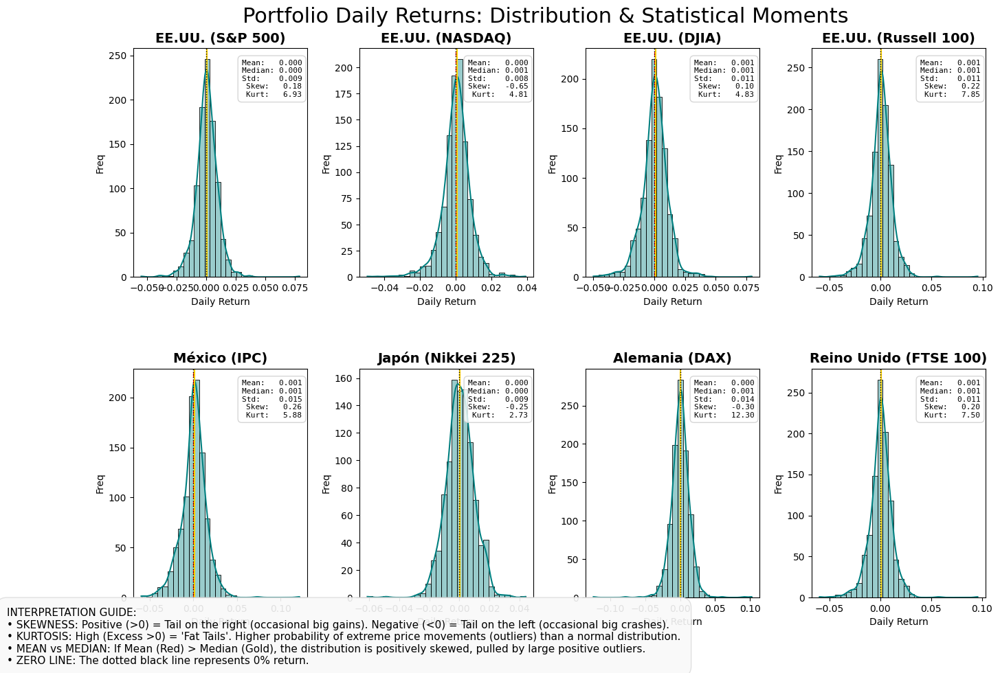


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
Alemania (DAX),0.0004,0.0007,0.0139,-0.2951,12.3042
EE.UU. (Russell 100),0.0005,0.0009,0.0110,0.2156,7.8453
Reino Unido (FTSE 100),0.0005,0.0007,0.0112,0.2003,7.5038
EE.UU. (S&P 500),0.0004,0.0004,0.0094,0.1801,6.9298
México (IPC),0.0006,0.0013,0.0147,0.2629,5.8826
EE.UU. (DJIA),0.0006,0.0009,0.0107,0.1019,4.8265
EE.UU. (NASDAQ),0.0003,0.0007,0.0080,-0.6460,4.8085
Japón (Nikkei 225),0.0004,0.0003,0.0095,-0.2489,2.7294


In [53]:
results_df = functions.plot_returns_distributions(daily_returns_bm, num_cols=4)

In [54]:
functions.plot_daily_returns(daily_returns_bm)

## Annualized Returns

In [55]:
# Annualized Returns
annualized_return_bm = daily_returns_bm.mean() * 252
annualized_return_bm.name = "Annualized Returns (%):"
annualized_return_bm = annualized_return_bm.sort_values(ascending=False)
print("Annualized Returns (%):")
print(round(annualized_return_bm, 2)*100)


Annualized Returns (%):
México (IPC)              16.0
EE.UU. (DJIA)             14.0
EE.UU. (Russell 100)      13.0
Reino Unido (FTSE 100)    13.0
Japón (Nikkei 225)        11.0
EE.UU. (S&P 500)          10.0
Alemania (DAX)            10.0
EE.UU. (NASDAQ)            7.0
Name: Annualized Returns (%):, dtype: float64


## Cumulative Daily Returns

In [56]:
cumulative_returns_bm = (1 + daily_returns_bm).cumprod()
cumulative_returns_bm = (cumulative_returns_bm - 1) * 100
display(cumulative_returns_bm.tail(5))

,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100)
Date,,,,,,,,
2026-01-15,39.311825,28.786220,63.040267,57.111223,65.988205,47.037787,31.645403,52.909467
2026-01-16,39.077641,28.740931,62.684893,57.010310,65.885008,48.122830,31.221280,52.800255
2026-01-21,40.766012,28.884584,61.748824,58.829705,67.839843,48.894812,30.685261,54.565861
2026-01-22,41.645939,29.037139,63.694805,59.701283,69.366126,49.577271,32.949208,55.411036
2026-01-23,40.827623,28.951973,63.986154,59.753485,69.837459,49.242812,33.340413,55.369497


In [57]:
functions.plot_cumulative_returns(cumulative_returns_bm)

In [58]:
# Final Cumulative Return in the period of evaluation for all Indices
print("Final Cumulative Returns (%)")
# cumulative_returns_final_bm = (1 + daily_returns_bm).prod() -1
cumulative_returns_final_bm = cumulative_returns_bm.iloc[-1]
cumulative_returns_final_bm = cumulative_returns_final_bm.sort_values(ascending=False)
cumulative_returns_final_bm = cumulative_returns_final_bm.rename("final cumulative returns Benchmarks (%)")
display(cumulative_returns_final_bm)

Final Cumulative Returns (%)


México (IPC)              69.837459
EE.UU. (DJIA)             63.986154
EE.UU. (Russell 100)      59.753485
Reino Unido (FTSE 100)    55.369497
Japón (Nikkei 225)        49.242812
EE.UU. (S&P 500)          40.827623
Alemania (DAX)            33.340413
EE.UU. (NASDAQ)           28.951973
Name: final cumulative returns Benchmarks (%), dtype: float64

## Volatility

In [59]:
#Annualized Volatility
annualized_volatility_bm = daily_returns_bm.std() * np.sqrt(252)

#Annualized Volatility Percentage
annualized_volatility_bm_perc = annualized_volatility_bm * 100

annualized_volatility_bm_perc.rename('Volatility Benchmarks (%)', inplace=True)

print("Volatility of Benchmark Indices (%):")
annualized_volatility_bm_perc.sort_values(ascending=False, inplace=True)
display(annualized_volatility_bm_perc)

Volatility of Benchmark Indices (%):


México (IPC)              23.270098
Alemania (DAX)            21.996810
Reino Unido (FTSE 100)    17.730141
EE.UU. (Russell 100)      17.383949
EE.UU. (DJIA)             17.018989
Japón (Nikkei 225)        15.045049
EE.UU. (S&P 500)          14.975885
EE.UU. (NASDAQ)           12.675817
Name: Volatility Benchmarks (%), dtype: float64

## Sharpe Ratios

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev)

In [60]:
# Sharpe Ratios
benchmark_sr = round((annualized_return_bm - (risk_free))/annualized_volatility_bm, 2)
benchmark_sr.rename('Sharpe Ratio', inplace=True)
benchmark_sr.sort_values(ascending=False, inplace=True)
display(benchmark_sr)

EE.UU. (DJIA)             0.63
EE.UU. (Russell 100)      0.58
México (IPC)              0.55
Japón (Nikkei 225)        0.53
Reino Unido (FTSE 100)    0.53
EE.UU. (S&P 500)          0.43
EE.UU. (NASDAQ)           0.31
Alemania (DAX)            0.29
Name: Sharpe Ratio, dtype: float64

## Summary

In [61]:
# Days of evaluation
no_days_compare = today.date() - first_valid_dates.iloc[0].date()
print(f"\nNumber of days of evaluation: {no_days_compare.days} days.")
print(f"From: {first_valid_dates.iloc[0].date().strftime("%B %d, %Y")} to: {today.date().strftime("%B %d, %Y")}")

# Summary Return and Volatility
print("\nSummary: Benchmark Indices:")
print(f"'{cumulative_returns_final_bm.index[0]}' has the largest total return {cumulative_returns_final_bm.iloc[0]:,.5}%")
print(f"and'{cumulative_returns_final_bm.index[-1]}' the lowest total return {cumulative_returns_final_bm.iloc[-1]:,.3}%")
print(f"\n'{annualized_volatility_bm_perc.index[0]}' has the largest volatility {annualized_volatility_bm_perc.iloc[0]:,.5}%")
print(f"and '{annualized_volatility_bm_perc.index[-1]}' the lowest volatility {annualized_volatility_bm_perc.iloc[-1]:,.5}%")



Number of days of evaluation: 1841 days.
From: January 11, 2021 to: January 26, 2026

Summary: Benchmark Indices:
'México (IPC)' has the largest total return 69.837%
and'EE.UU. (NASDAQ)' the lowest total return 29.0%

'México (IPC)' has the largest volatility 23.27%
and 'EE.UU. (NASDAQ)' the lowest volatility 12.676%


# Compare Initial Portfolio and Indices



## Daily Returns

Combine dataframes

In [62]:
# Combine Daily Returns of Initial Porfolio and
# Benchmark Indices in a single dataFrame to plot

# convert portfolio_daily_returns to datafre to merge it with Indices daily returns
portfolio_daily_returns_df = pd.DataFrame(portfolio_daily_returns)
portfolio_daily_returns_df.rename(columns={'portfolio daily returns':'Initial Portfolio'}, inplace=True)

# check if the lenghts of the dataframes match
if len(portfolio_daily_returns_df) != len(daily_returns_bm):
    print(f"Lengths of DataFrames don't match {len(portfolio_daily_returns_df)} vs {len(daily_returns_bm)} but a left merge will help")
    print("There are more dates in one dataframe than the other")


# Merge Daily Returns of Benchmark Indices and Initial Portfolio
# Note: Left-Merge on Benchmark daily returns because they don't operate on weekends or bank holidays
# thus we compare both benchmark and portfolio using the same labor day dates only.
merge_daily_returns = pd.merge(daily_returns_bm, portfolio_daily_returns_df, on='Date', how="left")
print("\nDaily Returns (merged portfolio and indices):")
display(merge_daily_returns.tail(5))

Lengths of DataFrames don't match 1229 vs 994 but a left merge will help
There are more dates in one dataframe than the other

Daily Returns (merged portfolio and indices):


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100),Initial Portfolio
Date,,,,,,,,,
2026-01-15,0.005958,0.005351,0.002616,0.002580,0.002483,-0.011183,-0.004246,0.002794,0.007361
2026-01-16,-0.001681,-0.000352,-0.002180,-0.000642,-0.000622,0.007379,-0.003222,-0.000714,-0.010046
2026-01-21,0.012140,0.001116,-0.005754,0.011588,0.011784,0.005212,-0.004085,0.011555,0.009496
2026-01-22,0.006251,0.001184,0.012031,0.005488,0.009094,0.004584,0.017324,0.005468,0.010997
2026-01-23,-0.005777,-0.000660,0.001780,0.000327,0.002783,-0.002236,0.002943,-0.000267,0.000308


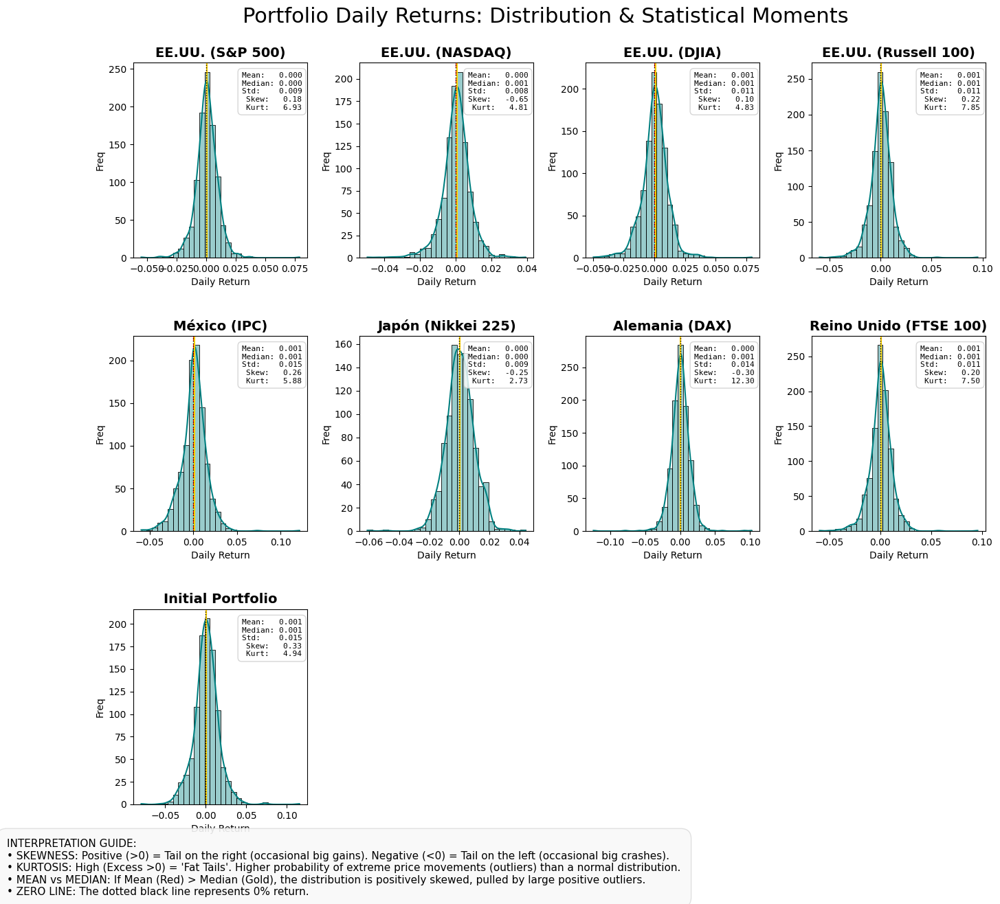


FAT-TAIL RISK RANKING (Sorted by Highest Kurtosis)


,Mean,Median,Std Dev,Skewness,Kurtosis
Ticker,,,,,
Alemania (DAX),0.0004,0.0007,0.0139,-0.2951,12.3042
EE.UU. (Russell 100),0.0005,0.0009,0.0110,0.2156,7.8453
Reino Unido (FTSE 100),0.0005,0.0007,0.0112,0.2003,7.5038
EE.UU. (S&P 500),0.0004,0.0004,0.0094,0.1801,6.9298
México (IPC),0.0006,0.0013,0.0147,0.2629,5.8826
Initial Portfolio,0.0006,0.0008,0.0153,0.3268,4.9375
EE.UU. (DJIA),0.0006,0.0009,0.0107,0.1019,4.8265
EE.UU. (NASDAQ),0.0003,0.0007,0.0080,-0.6460,4.8085
Japón (Nikkei 225),0.0004,0.0003,0.0095,-0.2489,2.7294


In [63]:
results_df = functions.plot_returns_distributions(merge_daily_returns, num_cols=4)

In [64]:
functions.plot_daily_returns(merge_daily_returns)

## Cumulative Returns

In [65]:
# Combine Comulative Returns of Initial Porfolio and Benchmark Indices in a single dataFrame to plot

# convert portfolio_cumulative_returns to datafre to merge it with Indices returns
portfolio_cumulative_returns_df = pd.DataFrame(portfolio_cumulative_returns)
portfolio_cumulative_returns_df.rename(columns={'portfolio cumulative returns':'Initial Portfolio'}, inplace=True)

# check if the lenghts of the dataframes match
if len(portfolio_cumulative_returns_df) != len(cumulative_returns_bm):
    print(f"Lengths of DataFrames don't match {len(portfolio_cumulative_returns_df)} vs {len(cumulative_returns_bm)} but a left merge will help")


# Merge Cumulative Returns of Benchmark Indices and Initial Portfolio
# Note: Left-Merge on Benchmark cumulative returns because they don't operate on weekends or bank holidays
# thus we compare both benchmark and portfolio using the same labor day dates only.
merge_cumulative_returns = pd.merge(cumulative_returns_bm, portfolio_cumulative_returns_df, on='Date', how="left")
print("\nDaily Cumulative Returns (merged portfolio and indices):")
display(merge_cumulative_returns.tail(5))

Lengths of DataFrames don't match 1229 vs 994 but a left merge will help

Daily Cumulative Returns (merged portfolio and indices):


,EE.UU. (S&P 500),EE.UU. (NASDAQ),EE.UU. (DJIA),EE.UU. (Russell 100),México (IPC),Japón (Nikkei 225),Alemania (DAX),Reino Unido (FTSE 100),Initial Portfolio
Date,,,,,,,,,
2026-01-15,39.311825,28.786220,63.040267,57.111223,65.988205,47.037787,31.645403,52.909467,80.748219
2026-01-16,39.077641,28.740931,62.684893,57.010310,65.885008,48.122830,31.221280,52.800255,78.932457
2026-01-21,40.766012,28.884584,61.748824,58.829705,67.839843,48.894812,30.685261,54.565861,77.935516
2026-01-22,41.645939,29.037139,63.694805,59.701283,69.366126,49.577271,32.949208,55.411036,79.892332
2026-01-23,40.827623,28.951973,63.986154,59.753485,69.837459,49.242812,33.340413,55.369497,79.947690


In [66]:
functions.plot_cumulative_returns(merge_cumulative_returns)

In [67]:
# Total Cumulative Returns
print("\nTotal (Final) cumulative Returns (%):")
merge_cumulative_returns_finals = merge_cumulative_returns.iloc[-1].copy()
merge_cumulative_returns_finals.rename('Final Cumulative Returns (%)', inplace=True)
merge_cumulative_returns_finals.sort_values(ascending=False, inplace=True)
display(merge_cumulative_returns_finals)



Total (Final) cumulative Returns (%):


Initial Portfolio         79.947690
México (IPC)              69.837459
EE.UU. (DJIA)             63.986154
EE.UU. (Russell 100)      59.753485
Reino Unido (FTSE 100)    55.369497
Japón (Nikkei 225)        49.242812
EE.UU. (S&P 500)          40.827623
Alemania (DAX)            33.340413
EE.UU. (NASDAQ)           28.951973
Name: Final Cumulative Returns (%), dtype: float64

## Volatility

In [68]:
# Anualized Volatility of portfolio + Benchmarks
print('\nAnnualized Volatility (%):')
merge_annualized_volatility = merge_daily_returns.std() * np.sqrt(252)
merge_annualized_volatility = merge_annualized_volatility * 100
merge_annualized_volatility.rename('Annualized Volatility (%)', inplace=True)
merge_annualized_volatility.sort_values(ascending=False, inplace=True)
display(merge_annualized_volatility)


Annualized Volatility (%):


Initial Portfolio         24.311825
México (IPC)              23.270098
Alemania (DAX)            21.996810
Reino Unido (FTSE 100)    17.730141
EE.UU. (Russell 100)      17.383949
EE.UU. (DJIA)             17.018989
Japón (Nikkei 225)        15.045049
EE.UU. (S&P 500)          14.975885
EE.UU. (NASDAQ)           12.675817
Name: Annualized Volatility (%), dtype: float64

## Sharpe Ratio

In [69]:
sharpe_ratio = pd.DataFrame()
sharpe_ratio['Annualized Returns (%)'] = merge_daily_returns.mean()*252*100 #Annualized returns
sharpe_ratio = pd.concat([sharpe_ratio['Annualized Returns (%)'], merge_annualized_volatility], axis=1)
sharpe_ratio['Sharpe Ratio'] = (sharpe_ratio['Annualized Returns (%)'] - (risk_free*100)) / (sharpe_ratio['Annualized Volatility (%)'])
sharpe_ratio.sort_values(by='Sharpe Ratio', ascending=False, inplace=True)
sharpe_ratio

,Annualized Returns (%),Annualized Volatility (%),Sharpe Ratio
EE.UU. (DJIA),13.988088,17.018989,0.628010
EE.UU. (Russell 100),13.386513,17.383949,0.580220
México (IPC),16.130288,23.270098,0.551364
Reino Unido (FTSE 100),12.741551,17.730141,0.532514
Japón (Nikkei 225),11.285307,15.045049,0.530760
Initial Portfolio,14.064721,24.311825,0.442777
EE.UU. (S&P 500),9.800221,14.975885,0.434046
EE.UU. (NASDAQ),7.252387,12.675817,0.311805
Alemania (DAX),9.721770,21.996810,0.291941


TO-do: Poner nota explicatoria de por que el SR es 1.58 aqui contra 1.3 arriba

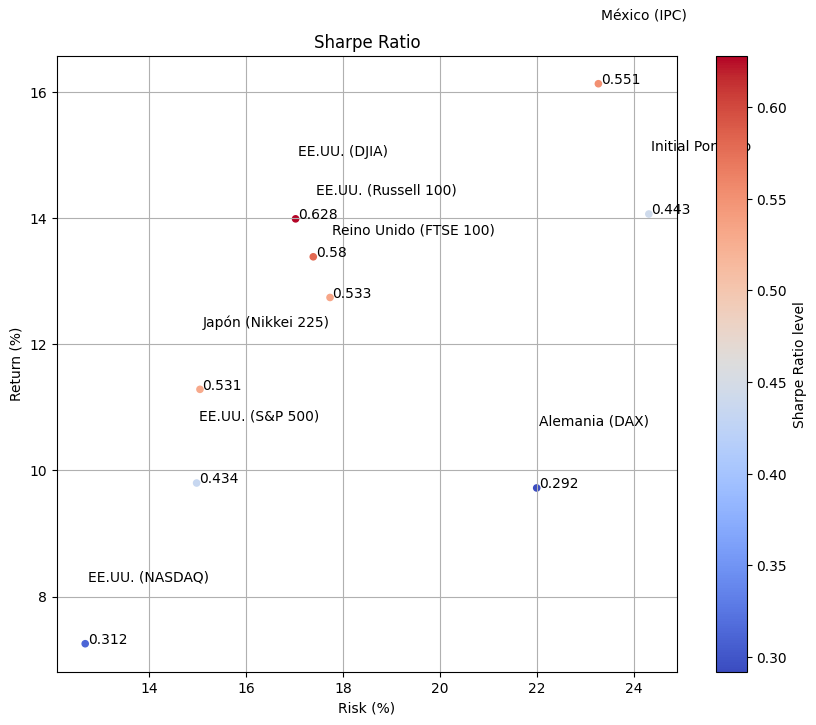

In [70]:
#fig, ax = plt.subplots()

ax = sharpe_ratio.plot.scatter(
                        x=sharpe_ratio.columns[1],
                        y=sharpe_ratio.columns[0],
                        c=sharpe_ratio.columns[2],
                        colormap='coolwarm',
                        alpha=1.0,
                        figsize=(10,8))
for i, label in enumerate(round(sharpe_ratio['Sharpe Ratio'],3)):
    ax.text(sharpe_ratio['Annualized Volatility (%)'].iloc[i] + 0.05, sharpe_ratio['Annualized Returns (%)'].iloc[i], label)
    ax.text(sharpe_ratio['Annualized Volatility (%)'].iloc[i] + 0.05, sharpe_ratio['Annualized Returns (%)'].iloc[i] + 1, sharpe_ratio.index[i])

ax.figure.axes[1].set_ylabel('Sharpe Ratio level')

plt.title('Sharpe Ratio')
plt.xlabel('Risk (%)')
plt.ylabel('Return (%)')
plt.grid()
plt.show()

## Summary

In [71]:
# Days of evaluation
no_days_compare = today.date() - first_valid_dates.iloc[0].date()
print(f"\nNumber of days of evaluation: {no_days_compare.days} days. From: {first_valid_dates.iloc[0].date().strftime("%B %d, %Y")} to: {today.date().strftime("%B %d, %Y")}")

# Summary Return, Volatility and Sharp Ratio
print("\nSummary: Benchmark Indices + Initial Portfolio")
print("\nReturns:")
print(f"'{merge_cumulative_returns_finals.index[0]}' has the largest total return {merge_cumulative_returns_finals.iloc[0]:,.5}%")
print(f"and'{merge_cumulative_returns_finals.index[-1]}' the lowest total return {merge_cumulative_returns_finals.iloc[-1]:,.3}%")
print("\nVolatility:")
print(f"'{merge_annualized_volatility.index[0]}' has the largest volatility {merge_annualized_volatility.iloc[0]:,.5}%")
print(f"and '{merge_annualized_volatility.index[-1]}' the lowest volatility {merge_annualized_volatility.iloc[-1]:,.5}%")
print("\nSharp Ratio:")
print(f"'{sharpe_ratio.index[0]}' has the best Sharpe Ratio {sharpe_ratio['Sharpe Ratio'].iloc[0]:,.4}")
print(f"and '{sharpe_ratio.index[-1]}' the worst Sharp Ratio {sharpe_ratio['Sharpe Ratio'].iloc[-1]:,.3}")


Number of days of evaluation: 1841 days. From: January 11, 2021 to: January 26, 2026

Summary: Benchmark Indices + Initial Portfolio

Returns:
'Initial Portfolio' has the largest total return 79.948%
and'EE.UU. (NASDAQ)' the lowest total return 29.0%

Volatility:
'Initial Portfolio' has the largest volatility 24.312%
and 'EE.UU. (NASDAQ)' the lowest volatility 12.676%

Sharp Ratio:
'EE.UU. (DJIA)' has the best Sharpe Ratio 0.628
and 'Alemania (DAX)' the worst Sharp Ratio 0.292


# Buy and Hold

## B&H - Stocks (Initial Portfolio)

Initial Investment $100,000 in each Asset

In [72]:
# B&H Stocks in initial Portfolio
functions.buy_and_hold_strategy(cumulative_returns, 100000, "Portfolio Stocks")


--- Investment Analysis: Portfolio Stocks ---
From: January 12, 2021 to January 23, 2026
Period: 1837 days


,Initial_Value_USD,Final_Value_USD,Margin_USD,Yield_Perc
Ticker,,,,
MFRISCOA-1.MX,"100,000.00","469,207.63","369,207.63",369.21
BVN,"100,000.00","349,288.98","249,288.98",249.29
SCCO,"100,000.00","335,736.03","235,736.03",235.74
IPOAF,"100,000.00","323,936.04","223,936.04",223.94
TECK,"100,000.00","296,329.05","196,329.05",196.33
PE&OLES.MX,"100,000.00","294,545.08","194,545.08",194.55
GMBXF,"100,000.00","287,886.62","187,886.62",187.89
COST,"100,000.00","285,482.18","185,482.18",185.48
ANFGF,"100,000.00","272,160.44","172,160.44",172.16


## B&H - Indices and Portfolio

Initial Investment $100,000 in each Index and Initial Portfolio

In [73]:
# B&H Indices & Portfolio (merged)
functions.buy_and_hold_strategy(merge_cumulative_returns, 100000, "Market Benchmarks Indices and Initital Portfolio")


--- Investment Analysis: Market Benchmarks Indices and Initital Portfolio ---
From: January 13, 2021 to January 23, 2026
Period: 1836 days


,Initial_Value_USD,Final_Value_USD,Margin_USD,Yield_Perc
Ticker,,,,
Initial Portfolio,"100,000.00","179,947.69","79,947.69",79.95
México (IPC),"100,000.00","169,837.46","69,837.46",69.84
EE.UU. (DJIA),"100,000.00","163,986.15","63,986.15",63.99
EE.UU. (Russell 100),"100,000.00","159,753.48","59,753.48",59.75
Reino Unido (FTSE 100),"100,000.00","155,369.50","55,369.50",55.37
Japón (Nikkei 225),"100,000.00","149,242.81","49,242.81",49.24
EE.UU. (S&P 500),"100,000.00","140,827.62","40,827.62",40.83
Alemania (DAX),"100,000.00","133,340.41","33,340.41",33.34
EE.UU. (NASDAQ),"100,000.00","128,951.97","28,951.97",28.95


# Dollar Cost Averaging (DCA)

## DCA - Stocks (Initial Portfolio)

Monthly Investment $100 in each Asset

In [74]:
# For individual stocks
functions.dollar_cost_averaging_strategy(prices, monthly_investment=100, title_suffix="Individual Stocks")



--- DCA Investment Analysis: Individual Stocks ---


,Total_Invested,Final_Value_USD,Margin_USD,Yield_Perc_%
Ticker,,,,
IPOAF,"6,100.00","25,759.88","19,659.88",322.29
PE&OLES.MX,"6,100.00","23,889.47","17,789.47",291.63
BVN,"6,100.00","22,989.12","16,889.12",276.87
MFRISCOA-1.MX,"6,100.00","18,674.51","12,574.51",206.14
SCCO,"6,100.00","16,908.74","10,808.74",177.19
ANFGF,"6,100.00","15,137.87","9,037.87",148.16
GMBXF,"6,100.00","15,003.02","8,903.02",145.95
CX,"6,100.00","12,859.14","6,759.14",110.81
WMT,"6,100.00","12,842.18","6,742.18",110.53


## DCA - Indices

Monthly Investment $100 in each Asset

In [75]:
# For Benchmarks and your Portfolio Index
functions.dollar_cost_averaging_strategy(benchmarks_prices, monthly_investment=100, title_suffix="Indices & Portfolio")


--- DCA Investment Analysis: Indices & Portfolio ---


,Total_Invested,Final_Value_USD,Margin_USD,Yield_Perc_%
Ticker,,,,
Alemania (DAX),"6,100.00","10,068.80","3,968.80",65.06
México (IPC),"6,100.00","9,593.78","3,493.78",57.28
EE.UU. (DJIA),"6,100.00","9,037.05","2,937.05",48.15
EE.UU. (Russell 100),"6,100.00","8,875.52","2,775.52",45.50
Reino Unido (FTSE 100),"6,100.00","8,794.49","2,694.49",44.17
EE.UU. (S&P 500),"6,100.00","8,136.16","2,036.16",33.38
EE.UU. (NASDAQ),"6,100.00","7,946.09","1,846.09",30.26
Japón (Nikkei 225),"6,100.00","7,884.86","1,784.86",29.26


# Momentum

Applied to all **Stocks** in Initial Portfolio

Momentum Ranking (Annual yield):


Ticker
MFRISCOA-1.MX    369.2
BVN              249.3
SCCO             235.7
IPOAF            223.9
TECK             196.3
PE&OLES.MX       194.5
GMBXF            187.9
COST             185.5
ANFGF            172.2
WMT              156.7
GLCNF            138.7
CX               132.8
FCX              113.4
EBAY              89.4
RTPPF             62.8
AMZN              53.6
BHPLF             52.6
MELI              21.3
UNP               18.2
TCTZF              8.2
BABA             -19.8
BBY              -25.1
TGT              -36.4
PDD              -38.3
ETSY             -67.1
Name: Final Cumulative Returns (%), dtype: float64

Inverse Momentum Ranking (Annual yield):


Ticker
ETSY             -67.1
PDD              -38.3
TGT              -36.4
BBY              -25.1
BABA             -19.8
TCTZF              8.2
UNP               18.2
MELI              21.3
BHPLF             52.6
AMZN              53.6
RTPPF             62.8
EBAY              89.4
FCX              113.4
CX               132.8
GLCNF            138.7
WMT              156.7
ANFGF            172.2
COST             185.5
GMBXF            187.9
PE&OLES.MX       194.5
TECK             196.3
IPOAF            223.9
SCCO             235.7
BVN              249.3
MFRISCOA-1.MX    369.2
Name: Final Cumulative Returns (%), dtype: float64

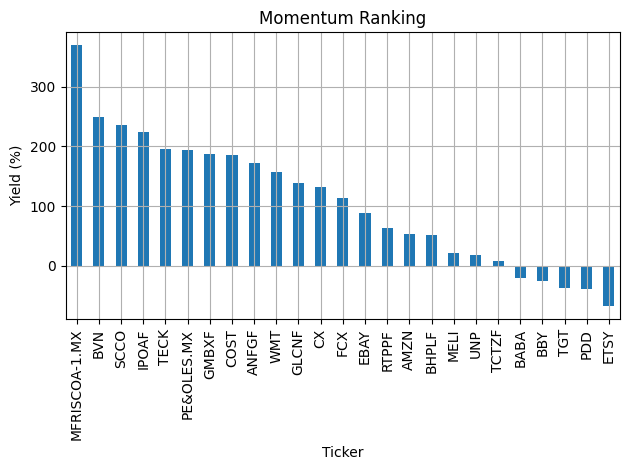

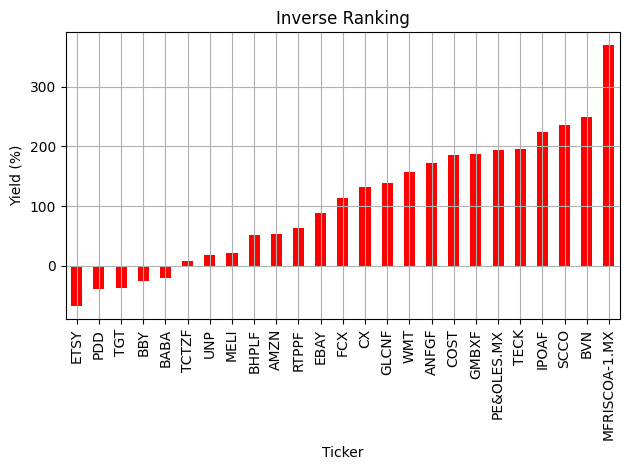

In [76]:
# call the DataFrame of the Final Cumulative Returns, which is the total return of each asset in the period.
cumulative_returns_final

# MOMENTUM: Order from largest to lowest return
momentum_ranking = cumulative_returns_final.sort_values(ascending=False)
print("Momentum Ranking (Annual yield):")
display(momentum_ranking)

# Inverse Ranking
inverse_ranking = cumulative_returns_final.sort_values(ascending=True)
print("Inverse Momentum Ranking (Annual yield):")
display(inverse_ranking)


# Plot Momentum and Inverse momentum

plt.Figure(figsize=(12, 9))
momentum_ranking.plot(kind='bar', title='Momentum Ranking')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.Figure(figsize=(12, 9))
inverse_ranking.plot(kind='bar', title='Inverse Ranking', color='red')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


Applied to Indices

Momentum Ranking (Annual yield) of Benchmark Indices:


México (IPC)              69.837459
EE.UU. (DJIA)             63.986154
EE.UU. (Russell 100)      59.753485
Reino Unido (FTSE 100)    55.369497
Japón (Nikkei 225)        49.242812
EE.UU. (S&P 500)          40.827623
Alemania (DAX)            33.340413
EE.UU. (NASDAQ)           28.951973
Name: final cumulative returns Benchmarks (%), dtype: float64

Inverse Momentum Ranking (Annual yield) of Benchmark Indices:


EE.UU. (NASDAQ)           28.951973
Alemania (DAX)            33.340413
EE.UU. (S&P 500)          40.827623
Japón (Nikkei 225)        49.242812
Reino Unido (FTSE 100)    55.369497
EE.UU. (Russell 100)      59.753485
EE.UU. (DJIA)             63.986154
México (IPC)              69.837459
Name: final cumulative returns Benchmarks (%), dtype: float64

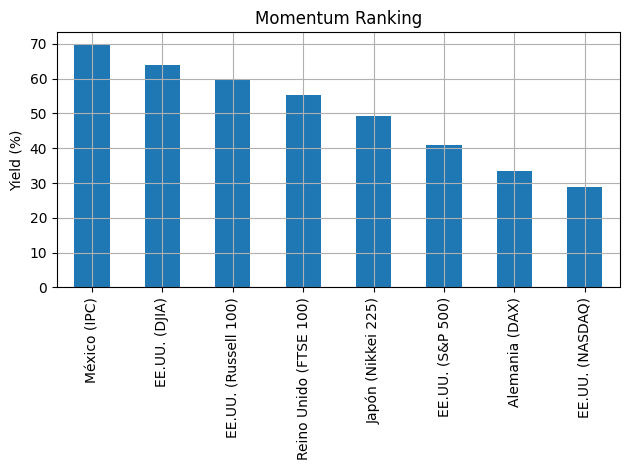

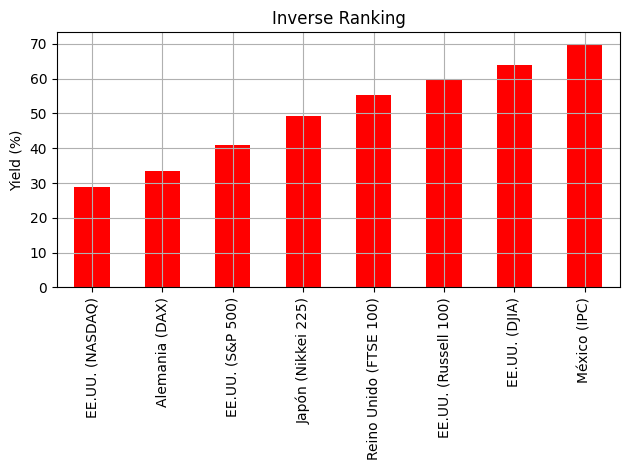

In [77]:
# call the DataFrame of the Final Cumulative Returns, which is the total return of each Index in the period.
cumulative_returns_final_bm

# MOMENTUM: Order from largest to lowest return
momentum_ranking_bm = cumulative_returns_final_bm.sort_values(ascending=False)
print("Momentum Ranking (Annual yield) of Benchmark Indices:")
display(momentum_ranking_bm)

# Inverse Ranking
inverse_ranking_bm = cumulative_returns_final_bm.sort_values(ascending=True)
print("Inverse Momentum Ranking (Annual yield) of Benchmark Indices:")
display(inverse_ranking_bm)

# Plot Momentum and Inverse momentum
plt.Figure(figsize=(12, 9))
momentum_ranking_bm.plot(kind='bar', title='Momentum Ranking')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.Figure(figsize=(12, 9))
inverse_ranking_bm.plot(kind='bar', title='Inverse Ranking', color='red')
plt.ylabel('Yield (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


# Correlation


## Correlation equation

Pearson correlation coefficient:

$$\rho_{X,Y} = \frac {cov(X,Y)}{\sigma_X \sigma_Y} = \frac{E[(X-\mu_X)(Y-\mu_Y)]}{\sigma_X \sigma_Y}$$

$$
\sigma_p^2 = w_A^2 \sigma_A^2 \;+\; w_B^2 \sigma_B^2 \;+\; 2\,w_A w_B\,\rho_{AB}\,\sigma_A \sigma_B
$$

## Stocks

In [78]:
functions.plot_interactive_heatmap_correlation(daily_returns, triangle='half')
functions.plot_extreme_correlations(daily_returns, num_pairs=10)



REGRESSION & VOLATILITY SUMMARY TABLE


,Correlation (r),R-Squared,p-value,Slope (Beta),Std Error,Intercept (Alpha),Vol_SCCO,Vol_FCX,Significant?,Vol_TECK,Vol_TCTZF,Vol_BABA,Vol_PDD,Vol_GLCNF,Vol_GMBXF,Vol_WMT,Vol_IPOAF,Vol_MFRISCOA-1.MX,Vol_BHPLF
Pair,,,,,,,,,,,,,,,,,,,
SCCO vs FCX,0.8089,0.6542,0.0000,0.9676,0.0201,-0.0002,0.0243,0.0290,Yes,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
TECK vs FCX,0.7312,0.5346,0.0000,0.7256,0.0193,0.0001,nan,0.0290,Yes,0.0292,nan,nan,nan,nan,nan,nan,nan,nan,nan
TECK vs SCCO,0.7201,0.5185,0.0000,0.5973,0.0164,0.0005,0.0243,nan,Yes,0.0292,nan,nan,nan,nan,nan,nan,nan,nan,nan
TCTZF vs BABA,0.6895,0.4754,0.0000,0.7734,0.0232,-0.0000,nan,nan,Yes,nan,0.0289,0.0324,nan,nan,nan,nan,nan,nan,nan
PDD vs BABA,0.6663,0.4439,0.0000,0.4903,0.0157,0.0001,nan,nan,Yes,nan,nan,0.0324,0.0441,nan,nan,nan,nan,nan,nan
GLCNF vs FCX,0.6166,0.3802,0.0000,0.7572,0.0276,0.0003,nan,0.0290,Yes,nan,nan,nan,nan,0.0236,nan,nan,nan,nan,nan
SCCO vs GLCNF,0.6112,0.3735,0.0000,0.5954,0.0220,0.0002,0.0243,nan,Yes,nan,nan,nan,nan,0.0236,nan,nan,nan,nan,nan
TECK vs GLCNF,0.6080,0.3696,0.0000,0.4914,0.0183,0.0003,nan,nan,Yes,0.0292,nan,nan,nan,0.0236,nan,nan,nan,nan,nan
TCTZF vs PDD,0.5942,0.3531,0.0000,0.9059,0.0350,0.0001,nan,nan,Yes,nan,0.0289,nan,0.0441,nan,nan,nan,nan,nan,nan



--------------------------------------------------
INTERPRETATION GUIDE:
--------------------------------------------------
• p-value Significance: Probability the correlation happened by chance. 
  Small values (e.g., < 1.42e-05) mean the relationship is mathematically solid.
• Significance?: 'Yes' if p_value < 0.05.
• Beta (Slope): The magnitude. A slope of 1.2 means for every 1% change in Stock A, 
  Stock B tends to move 1.2%.
• Alpha (Intercept): The 'excess' return of Stock B if Stock A's return was zero.
• Low Standard Error: Relationship is tight; Beta is a reliable predictor.
• High Standard Error: Lots of 'noise'; Beta is less reliable for hedging/pairs trading.
• Volatility (Vol):
  - High Vol + High Corr: High-octane comovers.
  - Low Vol + High Corr: Stable 'pairs trading' candidates.
  - Interpretation: If Vol Stock B > Vol Stock A, Beta will naturally be higher. 
    Check this to see if Beta is driven by correlation or just swing scale.


## Indices & Portfolio

In [79]:
functions.plot_interactive_heatmap_correlation(merge_daily_returns, triangle='half')
functions.plot_extreme_correlations(merge_daily_returns, num_pairs=10)


REGRESSION & VOLATILITY SUMMARY TABLE


,Correlation (r),R-Squared,p-value,Slope (Beta),Std Error,Intercept (Alpha),Vol_Reino Unido (FTSE 100),Vol_EE.UU. (Russell 100),Significant?,Vol_México (IPC),Vol_EE.UU. (S&P 500),Vol_Initial Portfolio,Vol_EE.UU. (DJIA),Vol_EE.UU. (NASDAQ)
Pair,,,,,,,,,,,,,,
Reino Unido (FTSE 100) vs EE.UU. (Russell 100),0.9894,0.9790,0.0000,0.9701,0.0045,0.0000,0.0112,0.0109,Yes,nan,nan,nan,nan,nan
México (IPC) vs EE.UU. (Russell 100),0.9562,0.9144,0.0000,0.7144,0.0069,0.0001,nan,0.0109,Yes,0.0147,nan,nan,nan,nan
Reino Unido (FTSE 100) vs México (IPC),0.9485,0.8997,0.0000,1.2449,0.0132,0.0000,0.0112,nan,Yes,0.0147,nan,nan,nan,nan
EE.UU. (Russell 100) vs EE.UU. (S&P 500),0.9198,0.8461,0.0000,0.7924,0.0107,-0.0000,nan,0.0109,Yes,nan,0.0094,nan,nan,nan
Reino Unido (FTSE 100) vs EE.UU. (S&P 500),0.9114,0.8307,0.0000,0.7698,0.0110,-0.0000,0.0112,nan,Yes,nan,0.0094,nan,nan,nan
México (IPC) vs EE.UU. (S&P 500),0.7942,0.6308,0.0000,0.5111,0.0124,0.0001,nan,nan,Yes,0.0147,0.0094,nan,nan,nan
Initial Portfolio vs México (IPC),0.7608,0.5788,0.0000,0.7282,0.0197,0.0002,nan,nan,Yes,0.0147,nan,0.0153,nan,nan
EE.UU. (DJIA) vs EE.UU. (NASDAQ),0.7558,0.5712,0.0000,0.5629,0.0155,-0.0000,nan,nan,Yes,nan,nan,nan,0.0107,0.0080
Initial Portfolio vs Reino Unido (FTSE 100),0.7450,0.5551,0.0000,0.5433,0.0154,0.0002,0.0112,nan,Yes,nan,nan,0.0153,nan,nan



--------------------------------------------------
INTERPRETATION GUIDE:
--------------------------------------------------
• p-value Significance: Probability the correlation happened by chance. 
  Small values (e.g., < 1.42e-05) mean the relationship is mathematically solid.
• Significance?: 'Yes' if p_value < 0.05.
• Beta (Slope): The magnitude. A slope of 1.2 means for every 1% change in Stock A, 
  Stock B tends to move 1.2%.
• Alpha (Intercept): The 'excess' return of Stock B if Stock A's return was zero.
• Low Standard Error: Relationship is tight; Beta is a reliable predictor.
• High Standard Error: Lots of 'noise'; Beta is less reliable for hedging/pairs trading.
• Volatility (Vol):
  - High Vol + High Corr: High-octane comovers.
  - Low Vol + High Corr: Stable 'pairs trading' candidates.
  - Interpretation: If Vol Stock B > Vol Stock A, Beta will naturally be higher. 
    Check this to see if Beta is driven by correlation or just swing scale.


# Covariance

* 	La matriz de covarianza es la base para calcular la varianza del portafolio:

$$ \sigma_p^2 = w^T \Sigma w $$

donde:
* w = vector de pesos del portafolio.
* $\Sigma = matriz$ de covarianzas.
* Un gestor de portafolios busca combinaciones de activos con **baja covarianza** para reducir la volatilidad total manteniendo el rendimiento esperado.


*	Covariance:$$
\text{Cov}(X,Y) = E[(X - \mu_X)(Y - \mu_Y)]$$
*	Values:
	*	Positive → one rises, other rises too.
	*	Negative → one rises, other goes down.
	*	near 0 → there's no clear relationtip.

## Stocks

In [80]:
# Plot ANNUALIZED variance/covariance Matrix =  returns.cov() * 252
functions.plot_annualized_covariance_heatmap(daily_returns, triangle='half')

## Indices & Portfolio

In [81]:
# Plot ANNUALIZED variance/covariance Matrix =  returns.cov() * 252
functions.plot_annualized_covariance_heatmap(merge_daily_returns, triangle='half')

# Efficient Frontier (Sharpe Ratio)

$$ Sharpe = \frac{R_p - R_f}{\sigma_p} = \frac{\mu_p - r_f}{\sigma_p}$$

Where:
* $R_p$: Expected Portfolio Return, $\mu$
* $R_f$: Risk Free Rate (can be 0 if ignored)
* $\sigma_p$: Portfolio Risk (StdDev)

Long-only: weights $\,w_i\in[0,1]$ y $\sum w_i=1$.

* Only purchases, no leverage (by shorting)
* Pros: Less operating risk
* Cons: Frontier less efficient than with shorts (due leverage)

Shorts allowed: weights $\,w_i\in[-1,1]$ y $\sum w_i=1 \text{  (or similar)}$.

* One can short sell and compensate with long positions
* Pros: Theoretical improvement of the Frontier with more options
* Cons:: Implied leverage, Margin requirements, Costs and Operational Risk
  



## Stocks

In [82]:
# --- EFFICIENT FRONTIER & CAPITAL MARKET LINE ANALYSIS---

functions.run_full_frontier_analysis(rets=daily_returns,
                          curr_port_weights = weights_df['Weights'],
                          curr_port_vol = portfolio_annualized_volatility,
                          curr_port_ret = portfolio_annualized_return,
                          mean_ann = daily_returns.mean() * 252,
                          cov_ann = daily_returns.cov() * 252,
                          rf_default = risk_free,
                          long_only = True,  # Set to True for standard long-only constraints
                          portfolio_value = Total_invested, #70000
                          yields = yields/100
                          )



Number of starts: To avoid local minimas. 10-25 normal (fast and robust), 50-100 (for large amount of stocks)

In [83]:
no_starts = 25
no_simul = 2000000


Optimizing Sharpe…

Optimum Weights (%) - Tangency Portfolio
Ticker
AMZN              0.00
ANFGF             6.87
BABA              0.00
BBY               0.00
BHPLF             1.44
BVN               7.81
COST             28.42
CX                0.00
EBAY              0.00
ETSY              0.00
FCX               0.00
GLCNF             0.00
GMBXF             5.02
IPOAF             7.70
MELI              0.00
MFRISCOA-1.MX    10.49
PDD               0.00
PE&OLES.MX        2.41
RTPPF             0.00
SCCO              2.60
TCTZF             0.00
TECK              0.00
TGT               0.00
UNP               0.00
WMT              27.23

Optimum Sharpe Ratio: 1.516
Expected Annual Return: 29.81%
Annual Risk: 17.49%

Simulating random Portfolios…

Simulated Portfolio with Minimum Volatility:
Volatility: 16.52%
Return: 21.90%
Sharpe Ratio: 1.126

Simulated Portfolio with Maximum Return:
Volatility: 35.91%
Return: 35.07%
Sharpe Ratio: 0.885

Current Portfolio:
Volatility: 23.97%
Return: 14

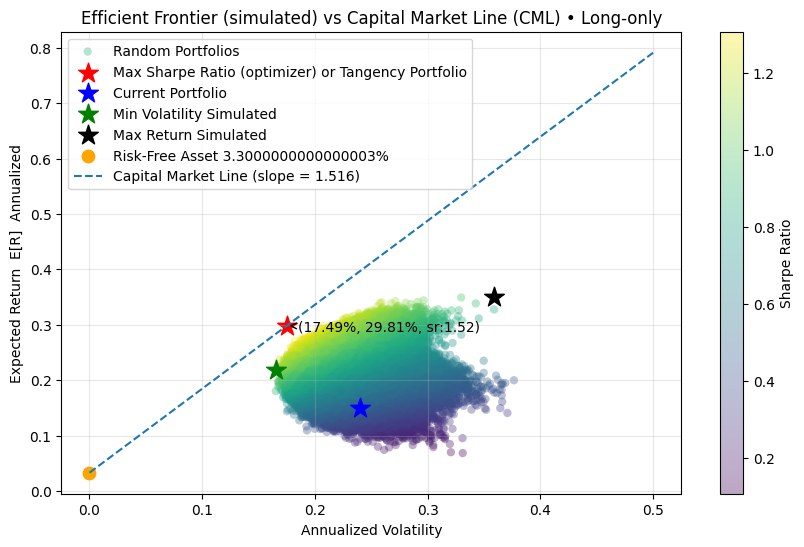

In [84]:
weights_optimal, vol_ret_sr_optimal = functions.efficient_froentier_sharp_ratio(
                daily_returns,
                [portfolio_annualized_volatility, portfolio_annualized_return],
                daily_returns.mean()*252, # Simple Arithmetic Mean Annualization
                daily_returns.cov()*252, #Annualized Covariance
                risk_free, #Risk Free
                True, # Long only = True, Short allowed = False
                no_starts, # no. of starts (25 default)
                no_simul, # no. of simulations
                123 # seed
                )

### Positions from current to optimal

In [85]:
# Recall Total Invested
Investment = Total_invested

# Current Portolio Weights and Positions
weights_df

# Optimal Weights from Efficient Frontier
weights_optimal

# Merge DataFrames
weights_df_Optimal = pd.merge(weights_df, weights_optimal, left_index=True, right_index=True, how='outer')

# New Investment (USD)
weights_df_Optimal['New Investment usd'] = weights_df_Optimal['Optimal Weights'] * Investment

# New QTY
weights_df_Optimal['New QTY'] = weights_df_Optimal['New Investment usd'] / weights_df_Optimal['Close Price']

# Difference in QTY or buy/sell position
weights_df_Optimal['Position_to_Optimal'] = weights_df_Optimal['New QTY'] - weights_df_Optimal['Current QTY']

weights_df_Optimal = round(weights_df_Optimal, 3)
display(weights_df_Optimal)

print(f"Current Investment: $ {round(Investment, 2)}")
print(f"New Investment: $ {round(weights_df_Optimal['New Investment usd'].sum(), 2)}")

,Current QTY,Close Price,Investment,Weights,Optimal Weights,New Investment usd,New QTY,Position_to_Optimal
Ticker,,,,,,,,
AMZN,20.90,239.16,4998.444,0.076,0.000,0.000,0.000,-20.900
ANFGF,2.03,49.25,99.977,0.002,0.069,4501.008,91.391,89.361
BABA,28.86,173.23,4999.418,0.076,0.000,0.000,0.000,-28.860
BBY,74.57,67.05,4999.919,0.076,0.000,0.000,0.000,-74.570
BHPLF,2.98,33.56,100.009,0.002,0.014,943.443,28.112,25.132
BVN,2.70,37.10,100.170,0.002,0.078,5116.867,137.921,135.221
COST,5.09,983.25,5004.742,0.076,0.284,18619.892,18.937,13.847
CX,7.75,12.91,100.052,0.002,0.000,0.000,0.000,-7.750
EBAY,53.41,93.61,4999.710,0.076,0.000,0.000,0.000,-53.410


Current Investment: $ 65516.86
New Investment: $ 65510.31


## Including Risk Free Asset

Once you have the tangency portfolio 𝑤𝑡  (long-only), the fraction of your wealth
𝑋 to put into the risky portfolio is 𝑦.

Choose 𝑦 based on your target volatility, target return, or risk-aversion:
* Objective 1. Target Volatility:

$$ 𝑦 = \frac{𝜎_𝑝}{𝜎_𝑡} $$

* Objective 2. Target Return:

$$ 𝑦 = \frac{𝐸_𝑝 − 𝑅_𝑓}{𝐸[𝑅_𝑡] − 𝑅_𝑓} $$

* Objective 3. Mean-Variance Utility (Expected Utility Funcion):

$$ U = E[R_p] - \frac{1}{2} \gamma \sigma_p^{2} $$

$$ 𝑦* = \frac{𝐸[𝑅_𝑡] − 𝑅_𝑓}{𝛾 𝜎_𝑡^{2}}$$

U : “Utility” — a scalar number representing the investor’s satisfaction from a portfolio. Its a parabolic function, higher gama the steeper the curve, thus more return expected for unit of risk.

𝛾 > 0: Risk aversion coefficient, a measure of how strongly the investor dislikes risk. Penalizes risk. Higher->more conservative.

![image.png](attachment:image.png)


Finally: invest 𝑦𝑋 in 𝑤_𝑡 and (1−𝑦)𝑋 in the risk-free asset, enforcing 0≤𝑦≤1 for long-only/no-borrowing.

In [86]:
# Objective 1. You want a target portfolio volatility 𝜎𝑝 :

# 𝜎𝑝 (target volatility):
# 90% of the Tangency portfolio volatility (can be any value)
target_volatility = vol_ret_sr_optimal[0] * 0.90

# The fraction of total wealth X invested in the tangency (risky) portfolio
y = target_volatility / vol_ret_sr_optimal[0]

print(f"Target Volatility: {target_volatility:.2%}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
ER_p = risk_free + y*(vol_ret_sr_optimal[1] - risk_free)
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free) / target_volatility:.2f} ")

Target Volatility: 15.74%
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 90.00%, that is $58,965.18usd
The fraction invested in the risk-free asset (1-y) is: 10.00%, that is $6,551.69usd
Expected Return E[Rp] = 27.16%
Sharpe Ratio = 1.52 


In [87]:
# Objective 2. You want a target expected return Ep

# Ep (target Expected Return):
# 90% of the Tangency portfolio return (can be any value)
target_return = vol_ret_sr_optimal[1] * 0.90

# The fraction of total wealth X invested in the tangency (risky) portfolio
y = (target_return - risk_free) / (vol_ret_sr_optimal[1] - risk_free)

print(f"Target Expected Return: {target_return:.2%}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
sigma_p = y * vol_ret_sr_optimal[0]
print(f"Volatility: {sigma_p:.2%}")
print(f"Sharpe Ratio = {(target_return - risk_free)/sigma_p:.2f}")

Target Expected Return: 26.83%
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 88.76%, that is $58,149.67usd
The fraction invested in the risk-free asset (1-y) is: 11.24%, that is $7,367.19usd
Volatility: 15.52%
Sharpe Ratio = 1.52


In [88]:
# Objective 3. You maximize mean–variance Utility (risk aversion 𝛾)

# Gamma (risk aversion coefficient) :
# If 𝛾 is large, the investor is very risk averse — even small increases in variance are penalized heavily.
# → They prefer portfolios with lower volatility, even if returns are modest.
# If 𝛾 is small, the investor is risk tolerant (or aggressive) — they are willing to accept more variance for more expected return.
gamma = 4

# a) Allowing borrowing (short)
# The fraction of total wealth X invested in the tangency (risky) portfolio
y_star = (vol_ret_sr_optimal[1] - risk_free) / (gamma * (vol_ret_sr_optimal[0]**2))
print("a) Allowing borrowing (short in risk asset):")
print(f"Mean-variance risk aversion coefficient: {gamma}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio y* is: {y_star:.2%}, that is ${y_star * Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y*) is: {1-y:.2%}, that is ${(1-y_star) * Total_invested:,.2f}usd")
# E[R_p] = Rf + y* (E[Rt] - Rf)
ER_p = risk_free + (y_star * (vol_ret_sr_optimal[1] - risk_free))
sigma_p = y_star * vol_ret_sr_optimal[0]
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Volatility sigma_p = {sigma_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free)/sigma_p:.2}")

# b) For long-only, no-borrowing constraint: set 𝑦=min⁡(1,max⁡(0,𝑦∗)).
y = min(1, max(0, y_star))
print("\nb) For long-only, no-borrowing constraint:")
print(f"Mean-variance risk aversion coefficient: {gamma}")
print(f"The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: {y:.2%}, that is ${y*Total_invested:,.2f}usd")
print(f"The fraction invested in the risk-free asset (1-y) is: {1-y:.2%}, that is ${(1-y)*Total_invested:,.2f}usd")
ER_p = risk_free + (y * (vol_ret_sr_optimal[1] - risk_free))
sigma_p = y * vol_ret_sr_optimal[0]
print(f"Expected Return E[Rp] = {ER_p:.2%}")
print(f"Volatility sigma_p = {sigma_p:.2%}")
print(f"Sharpe Ratio = {(ER_p - risk_free)/sigma_p:.2}")


a) Allowing borrowing (short in risk asset):
Mean-variance risk aversion coefficient: 4
The fraction of total wealth X invested in the tangency (risky) portfolio y* is: 216.68%, that is $141,959.43usd
The fraction invested in the risk-free asset (1-y*) is: 11.24%, that is $-76,442.57usd
Expected Return E[Rp] = 60.74%
Volatility sigma_p = 37.90%
Sharpe Ratio = 1.5

b) For long-only, no-borrowing constraint:
Mean-variance risk aversion coefficient: 4
The fraction of total wealth X invested in the tangency (risky) portfolio 'y' is: 100.00%, that is $65,516.86usd
The fraction invested in the risk-free asset (1-y) is: 0.00%, that is $0.00usd
Expected Return E[Rp] = 29.81%
Volatility sigma_p = 17.49%
Sharpe Ratio = 1.5


The tangency portfolio has an enormously high risk-adjusted return — i.e., its Sharpe ratio(𝐸[𝑅𝑡]−𝑅𝑓)/𝜎𝑡=0.405/0.135=3.0(E[Rt]−Rf​)/σt=0.405/0.135=3.0 is extremely high.


gamma = 4 That’s a moderate risk aversion level. Even with moderate aversion, such a high Sharpe ratio pushes you toward aggressive leverage.


The tangency portfolio has an extremely high Sharpe (3.0). With moderate risk aversion
𝛾=4, the utility-maximizing solution is to lever the tangency portfolio heavily (556% of wealth) because the reward-to-risk tradeoff is so favorable.


![image.png](attachment:image.png)

## Indices & Portfolio

In [89]:
# ANNUAL DIVIDEND YIELDS
yields_merge = functions.plot_annual_dividnd_yields(merge_daily_returns)

Annual Dividend Yields from yf 'dividendYield' (%):


EE.UU. (S&P 500)          0
EE.UU. (NASDAQ)           0
EE.UU. (DJIA)             0
EE.UU. (Russell 100)      0
México (IPC)              0
Japón (Nikkei 225)        0
Alemania (DAX)            0
Reino Unido (FTSE 100)    0
Initial Portfolio         0
Name: dividendYield, dtype: int64

In [90]:
# --- EFFICIENT FRONTIER & CAPITAL MARKET LINE ANALYSIS---

functions.run_full_frontier_analysis(rets = merge_daily_returns,
                          curr_port_weights = weights_df['Weights'],
                          curr_port_vol = portfolio_annualized_volatility,
                          curr_port_ret = portfolio_annualized_return,
                          mean_ann = merge_daily_returns.mean() * 252,
                          cov_ann = merge_daily_returns.cov() * 252,
                          rf_default = risk_free,
                          long_only = True,  # Set to True for standard long-only constraints
                          portfolio_value = Total_invested, #100000
                          yields = yields_merge/100
                          )


Optimizing Sharpe…

Optimum Weights (%) - Tangency Portfolio
EE.UU. (S&P 500)           0.00
EE.UU. (NASDAQ)            0.00
EE.UU. (DJIA)             37.29
EE.UU. (Russell 100)      15.88
México (IPC)               8.24
Japón (Nikkei 225)        30.27
Alemania (DAX)             8.33
Reino Unido (FTSE 100)     0.00
Initial Portfolio          0.00

Optimum Sharpe Ratio: 0.760
Expected Annual Return: 12.90%
Annual Risk: 12.62%

Simulating random Portfolios…

Simulated Portfolio with Minimum Volatility:
Volatility: 10.56%
Return: 9.24%
Sharpe Ratio: 0.563

Simulated Portfolio with Maximum Return:
Volatility: 21.22%
Return: 15.46%
Sharpe Ratio: 0.573

Current Portfolio:
Volatility: 23.97%
Return: 14.91%
Sharpe Ratio: 0.485


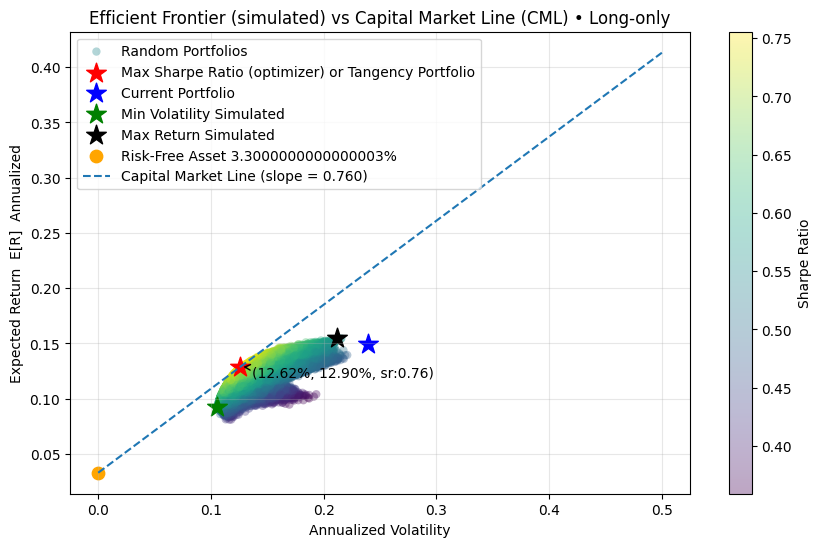

In [91]:
weights_optimal, vol_ret_sr_optimal = functions.efficient_froentier_sharp_ratio(
                merge_daily_returns,
                [portfolio_annualized_volatility, portfolio_annualized_return],
                merge_daily_returns.mean()*252, # Simple Arithmetic Mean Annualization
                merge_daily_returns.cov()*252, #Annualized Covariance
                risk_free, #Risk Free
                True, # Long only = True, Short allowed = False
                no_starts, # no. of starts (25 default)
                no_simul, # no. of simulations
                123 # seed
                )

## **TO-DO: Include GUI and "make your own portfolio" with a variety of Stocks to choose.

(see Frontera Eficiente for GUI)

# Indicators: alpha, Beta, R^2, SR, Sortino, VaR, CVaR - vs with Benchmark

| Métrica          | Valor Óptimo / Bueno                  | Interpretación                                                                 |
|------------------|---------------------------------------|---------------------------------------------------------------------------------|
| **Alpha (α)**    | > 0 (ideal: +2% a +10% anual)         | Exceso de retorno sobre lo esperado por el CAPM; positivo indica valor agregado. |
| **Beta (β)**     | ≈ 1 (mercado), <1 defensivo, >1 agresivo | Sensibilidad al mercado; >1 = más volátil, <1 = más estable.                     |
| **R² (correlación)** | > 0.8 (80% o más) | El portafolio se mueve casi igual que el benchmark (muy “indexado”).|
| **R² (correlación)** | 0.6 – 0.8                          | Buena relación con el mercado, pero con diferencias notables.|
| **R² (correlación)** | < 0.30                         | El portafolio se comporta muy distinto al mercado (alta independencia).|
| **µ (Retorno anual)** | > 8% estable, > 15% agresivo      | Rendimiento esperado anualizado del portafolio.                                 |
| **σ (Volatilidad anual)** | 10%–20% moderado, <10% defensivo, >25% muy riesgoso | Mide el riesgo total (desviación estándar).                                     |
| **Sharpe Ratio** | > 1 bueno, > 1.5 muy bueno, > 2 excelente | Retorno ajustado por riesgo total.                                              |
| **Sortino Ratio**| > 2 excelente                         | Retorno ajustado por riesgo a la baja (mejor si >> Sharpe).                     |
| **VaR (95%, 1d)**| < 2%                                  | Pérdida máxima esperada en un día con 95% de confianza.                         |
| **CVaR (95%, 1d)**| < 3%                                  | Pérdida promedio en los peores días (cola izquierda de la distribución).        |

In [92]:
#recall
display(benchmark_indices)

{'EE.UU. (S&P 500)': '^GSPC',
 'EE.UU. (NASDAQ)': '^IXIC',
 'EE.UU. (DJIA)': '^DJI',
 'EE.UU. (Russell 100)': '^RUI',
 'México (IPC)': '^MXX',
 'Japón (Nikkei 225)': '^N225',
 'Alemania (DAX)': '^GDAXI',
 'Reino Unido (FTSE 100)': '^FTSE'}

Descargando datos…

Weights: 
               Optimized Portfolio (max SR) Weights  Current Portfolio Weights
Ticker                                                                        
AMZN                                           0.00                       0.08
ANFGF                                          0.10                       0.00
BABA                                           0.00                       0.08
BBY                                            0.00                       0.08
BHPLF                                          0.03                       0.00
BVN                                            0.10                       0.00
COST                                           0.34                       0.08
CX                                             0.00                       0.00
EBAY                                           0.03                       0.08
ETSY                                           0.00                       0.08
FCX                   

,μ anual,σ anual,Sharpe,Sortino
Current Portfolio,0.1495,0.2404,0.4847,0.8170
Portafolio (max SR),0.3105,0.1793,1.5470,2.7666
Benchmark [^GSPC],0.1441,0.1707,0.6507,NaN


Exceso risk-free usado: 3.30% anual | Rend: simple | VaR: 95% (historical)

Alpha/Beta/R²/VaR/CVaR con respecto a ^GSPC


,Alpha (anual),Beta,R²,VaR 1d,CVaR 1d
Current Portfolio,0.0021,1.0297,0.5347,0.0236,0.0334
Portafolio (max SR),0.2123,0.5861,0.3113,0.0152,0.0229


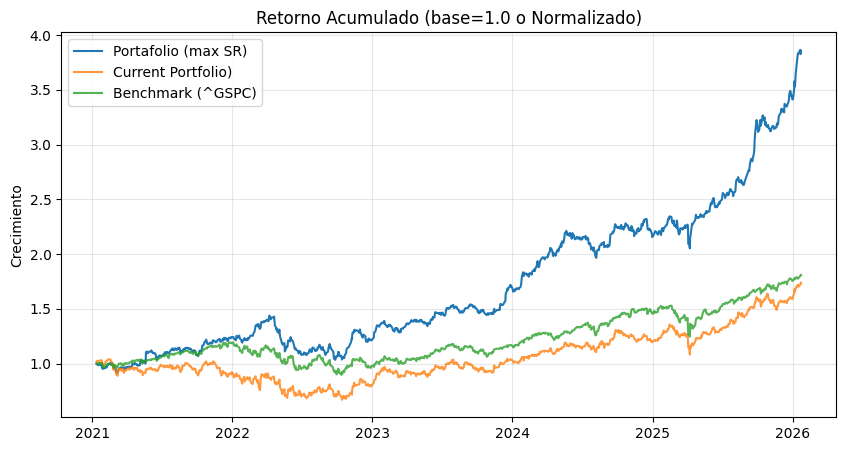

In [93]:
# Choose a benchmark to compare for alpha, beta, R2...
index_benchmark = 0

functions.indicators(tickers, start_date, today, benchmark_indices, index_benchmark,
                     risk_free, portfolio_weights=pd.Series(weights_df['Weights']), no_starts=no_starts)


## ** TO-DO: EN Metricas Anualizadas incluir de forma automatica los otros 6 benchmarks

# TO-DO: CAPM (en archivo de Indicadores)

# CAPM (Capital Asset Pricing Model)

CAPM Equation:

$$
r_{i} = r_{f} + \beta_{im}*(r_{m}-r_{f})
$$

***where*** :\
$r_i = $ Expected Asset Return\
$r_f = $ Risk-free asset Return\
$\beta_{i,m} = $ Asset Beta w.r.t market\
$r_m = $ Market Return

\
Risk-free is the minimum Return an Investor can accept.\
Difference between $r_{m}$ and $r_{f}$ is the Premium that the investor recieves by taking the risk (**equity risk Premium**).\
**$\beta$** measures the cuantity of Risk of an asset with respect to the Market.

### Asset Beta ( $\beta$ )


$$\beta = \frac{\text{Cov(}r_A, r_m\text{)}}{Var(r_m)} = \frac{\sigma_{A,m}}{\sigma_m^2} = \frac{ρ_{A,m} σ_m σ_A}{\sigma_m^2} = \frac{ρ_{A,m}σ_A}{\sigma_m}$$


# Candles

# PDF EXPORT